#**Кейс «Прогнозирование конечных свойств новых материалов (композиционных материалов)»**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.ensemble import GradientBoostingRegressor
import lightgbm as lgbm
import xgboost as xgb
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.neural_network import MLPRegressor
from tensorflow.keras import Sequential
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam

%matplotlib inline

##Загрузка данных и объединение данных

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
df1 = pd.read_excel('/content/drive/MyDrive/MGTU_BAUMANA_study/final_work_data/X_bp.xlsx')

In [ ]:
df2 = pd.read_excel('/content/drive/MyDrive/MGTU_BAUMANA_study/final_work_data/X_nup.xlsx')

In [ ]:
#Для удобного объединения данных переименуем столбцы индексов(необязательное действие)
df1.rename(columns = {'Unnamed: 0' : 'ind'}, inplace=True)
df2.rename(columns = {'Unnamed: 0' : 'ind'}, inplace=True)

In [ ]:
#Индексам привсоим целочисленные значения
df1.ind = df1.ind.astype(np.int32)
df2.ind = df2.ind.astype(np.int32)

In [ ]:
df1.head()

,ind,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0,0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0
1,1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0
2,2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0
3,3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0
4,4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0


In [ ]:
#для последующего удобного обращения к столбцам пишем функцию транслита
def column_rename(columns):
  ru_text = 'абвгдеёжзийклмнопрстуфхцчшщъыьэюя'
  en_text = 'a|b|v|g|d|e|e|zh|z|i|i|k|l|m|n|o|p|r|s|t|u|f|kh|tc|ch|sh|shch||y||e|iu|ia'.split('|')
  rename_list = []
  for i in range(len(columns)):
    columns[i] = columns[i].lower()
    if ',' in columns[i]:
      columns[i] = columns[i].split(',')[0]
    columns[i] = columns[i].replace(' ', '_')
    columns[i] = columns[i].translate({ord(k):v for k,v in zip(ru_text,en_text)})
    rename_list.append(columns[i])
  return  rename_list

In [ ]:
#переименуем первый датафрейм
df1.columns = column_rename(list(df1.columns))


In [ ]:
#переименуем второй датафрейм
df2.columns = column_rename(list(df2.columns))

In [ ]:
#Проверка результатов
df1.head()

,ind,sootnoshenie_matritca-napolnitel,plotnost,modul_uprugosti,kolichestvo_otverditelia,soderzhanie_epoksidnykh_grupp,temperatura_vspyshki,poverkhnostnaia_plotnost,modul_uprugosti_pri_rastiazhenii,prochnost_pri_rastiazhenii,potreblenie_smoly
0,0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0
1,1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0
2,2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0
3,3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0
4,4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0


In [ ]:
df2.head()

,ind,ugol_nashivki,shag_nashivki,plotnost_nashivki
0,0,0.0,4.0,57.0
1,1,0.0,4.0,60.0
2,2,0.0,4.0,70.0
3,3,0.0,5.0,47.0
4,4,0.0,5.0,57.0


In [ ]:
#Объединяем датафреймы
df = pd.merge(df1, df2, how = 'inner')

##EDA

Просмотр получившейся таблицы

In [ ]:
df.head()

,ind,sootnoshenie_matritca-napolnitel,plotnost,modul_uprugosti,kolichestvo_otverditelia,soderzhanie_epoksidnykh_grupp,temperatura_vspyshki,poverkhnostnaia_plotnost,modul_uprugosti_pri_rastiazhenii,prochnost_pri_rastiazhenii,potreblenie_smoly,ugol_nashivki,shag_nashivki,plotnost_nashivki
0,0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0.0,4.0,57.0
1,1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0.0,4.0,60.0
2,2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0.0,4.0,70.0
3,3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0.0,5.0,47.0
4,4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0.0,5.0,57.0


Кол-во строк и столбцов

In [ ]:
df.shape

(1023, 14)

Строки, столбцы, названия столбцов, и типы данных

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 14 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   ind                               1023 non-null   int32  
 1   sootnoshenie_matritca-napolnitel  1023 non-null   float64
 2   plotnost                          1023 non-null   float64
 3   modul_uprugosti                   1023 non-null   float64
 4   kolichestvo_otverditelia          1023 non-null   float64
 5   soderzhanie_epoksidnykh_grupp     1023 non-null   float64
 6   temperatura_vspyshki              1023 non-null   float64
 7   poverkhnostnaia_plotnost          1023 non-null   float64
 8   modul_uprugosti_pri_rastiazhenii  1023 non-null   float64
 9   prochnost_pri_rastiazhenii        1023 non-null   float64
 10  potreblenie_smoly                 1023 non-null   float64
 11  ugol_nashivki                     1023 non-null   float64
 12  shag_n

После объединения датафреймов колонка 'ind' более не нужна, удаляем.

In [ ]:
df = df.drop(['ind'], axis=1)

In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
sootnoshenie_matritca-napolnitel,1023.0,2.930366,0.913222,0.389403,2.317887,2.906878,3.552660,5.591742
plotnost,1023.0,1975.734888,73.729231,1731.764635,1924.155467,1977.621657,2021.374375,2207.773481
modul_uprugosti,1023.0,739.923233,330.231581,2.436909,500.047452,739.664328,961.812526,1911.536477
kolichestvo_otverditelia,1023.0,110.570769,28.295911,17.740275,92.443497,110.564840,129.730366,198.953207
soderzhanie_epoksidnykh_grupp,1023.0,22.244390,2.406301,14.254985,20.608034,22.230744,23.961934,33.000000
temperatura_vspyshki,1023.0,285.882151,40.943260,100.000000,259.066528,285.896812,313.002106,413.273418
poverkhnostnaia_plotnost,1023.0,482.731833,281.314690,0.603740,266.816645,451.864365,693.225017,1399.542362
modul_uprugosti_pri_rastiazhenii,1023.0,73.328571,3.118983,64.054061,71.245018,73.268805,75.356612,82.682051
prochnost_pri_rastiazhenii,1023.0,2466.922843,485.628006,1036.856605,2135.850448,2459.524526,2767.193119,3848.436732
potreblenie_smoly,1023.0,218.423144,59.735931,33.803026,179.627520,219.198882,257.481724,414.590628


На этапе рассмотрения статистики необходимо привлечение эксперта, для получения информации, насколько данные могут соответствовать действительности и нужно ли по описательной статистике производить какие то действия. В данном случае, т.к. эксперта предметной области привлечь не представляется возможным - примем данные как корректные.

Уникальные значения

In [ ]:
df.nunique()

sootnoshenie_matritca-napolnitel    1014
plotnost                            1013
modul_uprugosti                     1020
kolichestvo_otverditelia            1005
soderzhanie_epoksidnykh_grupp       1004
temperatura_vspyshki                1003
poverkhnostnaia_plotnost            1004
modul_uprugosti_pri_rastiazhenii    1004
prochnost_pri_rastiazhenii          1004
potreblenie_smoly                   1003
ugol_nashivki                          2
shag_nashivki                        989
plotnost_nashivki                    988
dtype: int64

Видим, что во всех столбцах, кроме угла нашивки, большое количество уникальных значений. Для угла нашибки можем использовать LabelEncoder или OneHotEncoder

In [ ]:
df.ugol_nashivki.value_counts()

0.0     520
90.0    503
Name: ugol_nashivki, dtype: int64

In [ ]:
df.isna().sum()

sootnoshenie_matritca-napolnitel    0
plotnost                            0
modul_uprugosti                     0
kolichestvo_otverditelia            0
soderzhanie_epoksidnykh_grupp       0
temperatura_vspyshki                0
poverkhnostnaia_plotnost            0
modul_uprugosti_pri_rastiazhenii    0
prochnost_pri_rastiazhenii          0
potreblenie_smoly                   0
ugol_nashivki                       0
shag_nashivki                       0
plotnost_nashivki                   0
dtype: int64

Пропущенных значений в датасете нет.

In [ ]:
df.duplicated().sum()

0

Дубликатов так же не обнаружено.

Для лучшего понимания данных произведем визуализацию

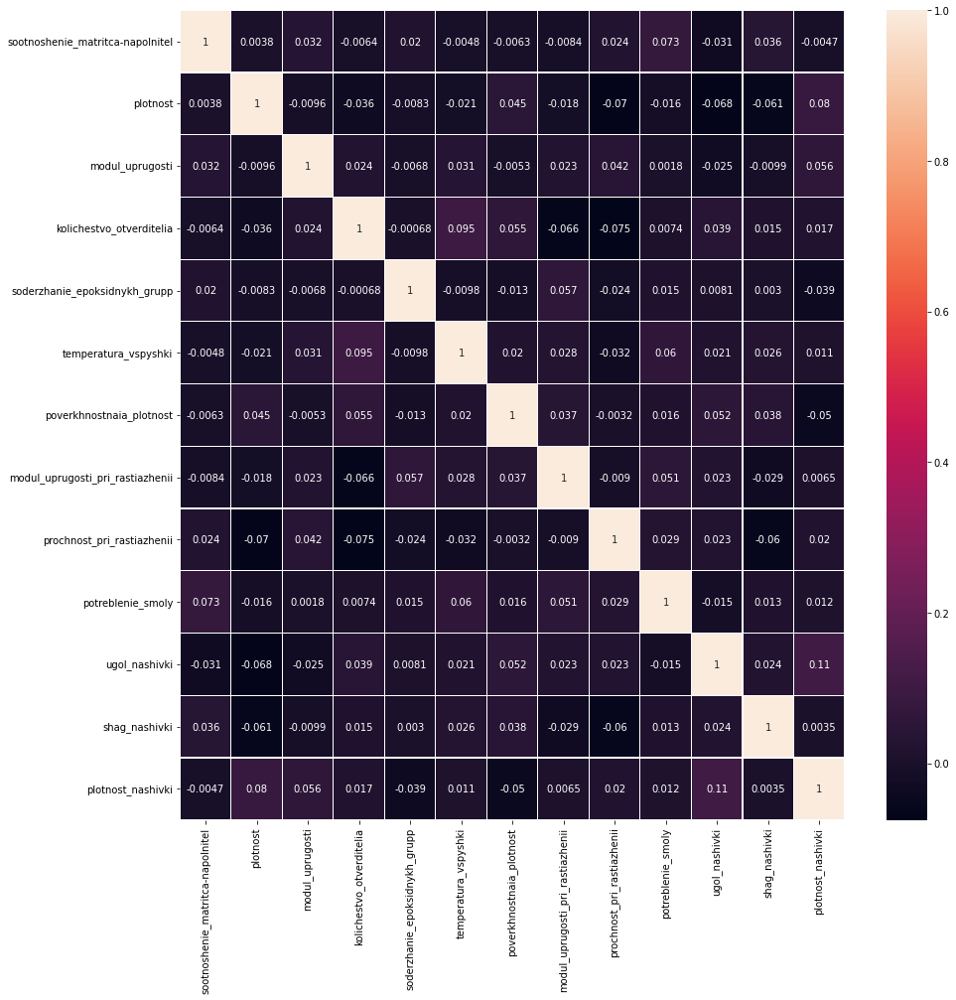

In [ ]:
plt.figure(figsize=(15,15))
sns.heatmap(df.corr(), linewidth=0.2, annot=True)

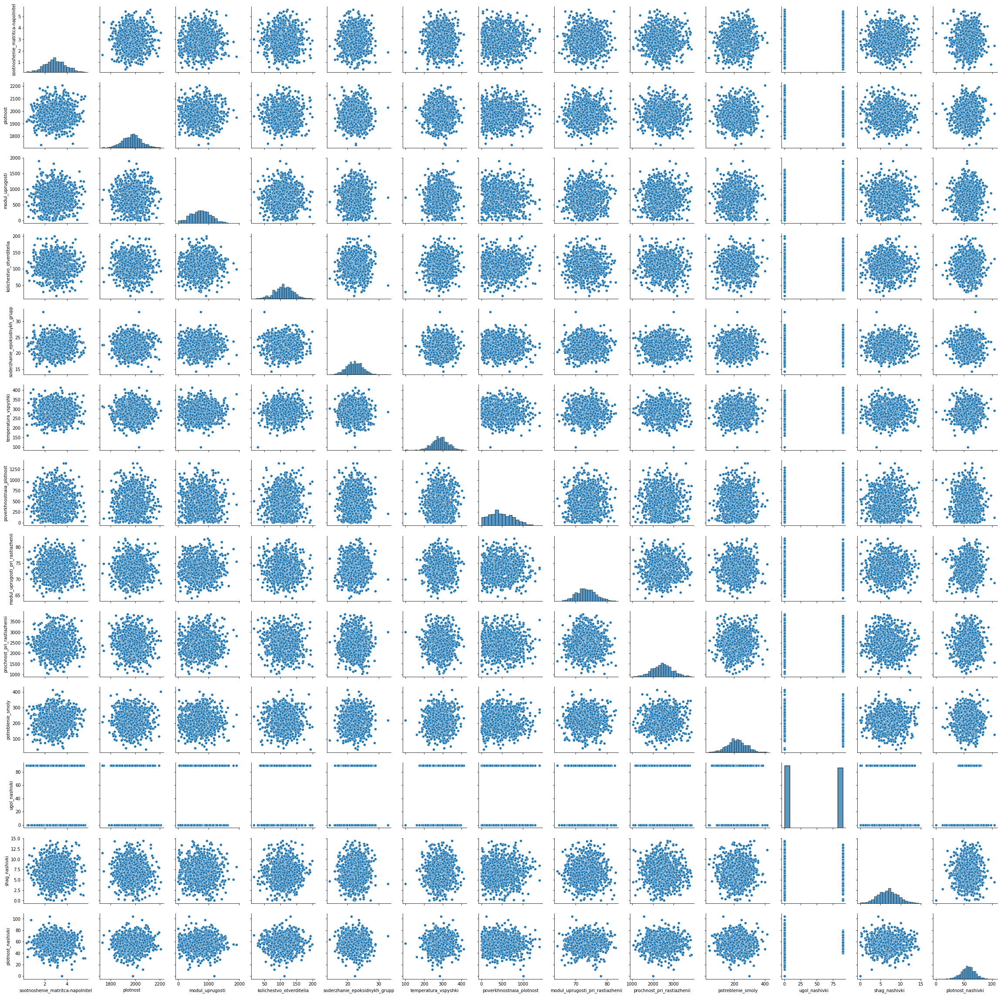

In [ ]:
sns.pairplot(df)

Корреляция между признаками крайне низкая

In [ ]:
df_drop = df[(np.abs(stats.zscore(df)) <= 3).all(axis=1)]

Удалили выбросы. Оставшееся кол-во строк - 999

In [ ]:
df_drop.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 999 entries, 1 to 1022
Data columns (total 13 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   sootnoshenie_matritca-napolnitel  999 non-null    float64
 1   plotnost                          999 non-null    float64
 2   modul_uprugosti                   999 non-null    float64
 3   kolichestvo_otverditelia          999 non-null    float64
 4   soderzhanie_epoksidnykh_grupp     999 non-null    float64
 5   temperatura_vspyshki              999 non-null    float64
 6   poverkhnostnaia_plotnost          999 non-null    float64
 7   modul_uprugosti_pri_rastiazhenii  999 non-null    float64
 8   prochnost_pri_rastiazhenii        999 non-null    float64
 9   potreblenie_smoly                 999 non-null    float64
 10  ugol_nashivki                     999 non-null    float64
 11  shag_nashivki                     999 non-null    float64
 12  plotnos

Визуализация выбросов до и после удаления:

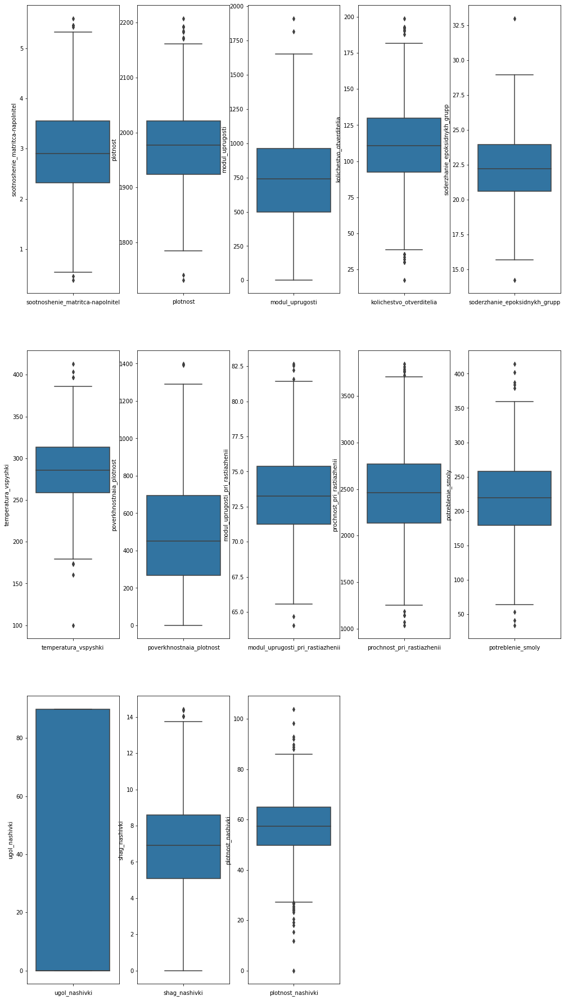

In [ ]:
n = 1
s = 3
c = 5
fig = plt.figure(figsize = (17, 32))
for i in df.columns:
    plt.subplot(s, c, n)
    plt.xlabel(i)
    sns.boxplot(y = df[i])
    n = n+1
plt.show()

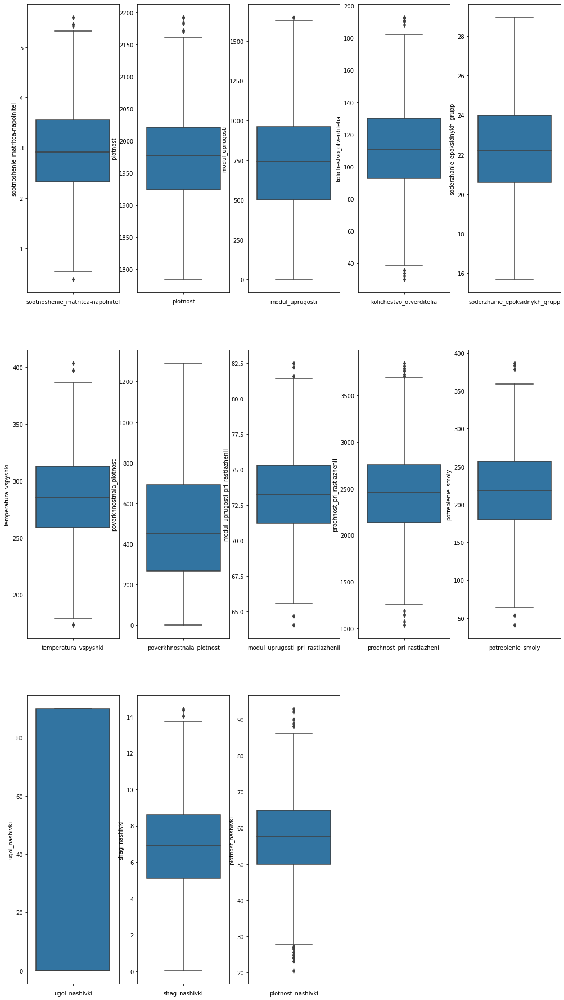

In [ ]:
n = 1
s = 3
c = 5
fig = plt.figure(figsize = (17, 32))
for i in df_drop.columns:
    plt.subplot(s, c, n)
    plt.xlabel(i)
    sns.boxplot(y = df_drop[i])
    n = n+1
plt.show()

Кодируем угол нашивки с помощью get_dummies

In [ ]:
ugol_nashivki = pd.get_dummies(df_drop.ugol_nashivki, prefix='ugol')
df_drop = pd.concat([df_drop, ugol_nashivki], axis=1)
df_drop = df_drop.drop(['ugol_nashivki'], axis = 1)

In [ ]:
df_drop.head()

,sootnoshenie_matritca-napolnitel,plotnost,modul_uprugosti,kolichestvo_otverditelia,soderzhanie_epoksidnykh_grupp,temperatura_vspyshki,poverkhnostnaia_plotnost,modul_uprugosti_pri_rastiazhenii,prochnost_pri_rastiazhenii,potreblenie_smoly,shag_nashivki,plotnost_nashivki,ugol_0.0,ugol_90.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,4.0,60.0,1,0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,5.0,47.0,1,0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,5.0,57.0,1,0
5,2.767918,2000.0,748.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,5.0,60.0,1,0
6,2.569620,1910.0,807.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,5.0,70.0,1,0


Оценка плотности ядра

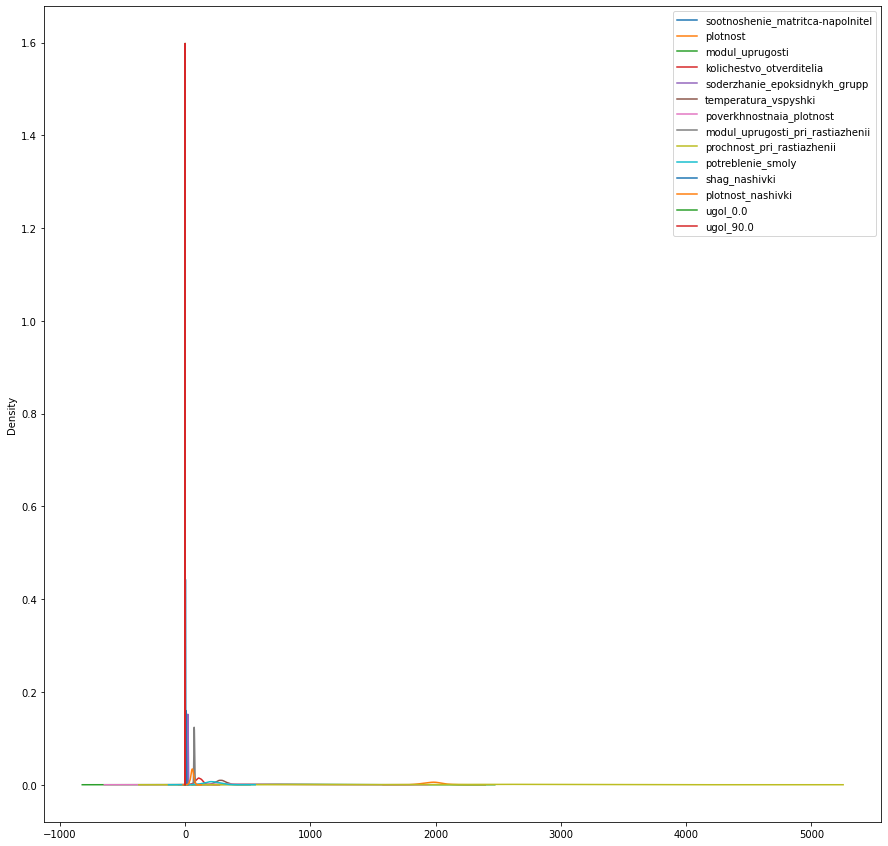

In [ ]:
fig, ax = plt.subplots(figsize=(15,15))
df_drop.plot(kind = 'kde', ax = ax)

Необходимо провести нормализацию

In [ ]:
scaler = preprocessing.MinMaxScaler()
df_drop_norm = pd.DataFrame(scaler.fit_transform(df_drop), columns = df_drop.columns).round(2)


In [ ]:
df_drop_norm.head()

,sootnoshenie_matritca-napolnitel,plotnost,modul_uprugosti,kolichestvo_otverditelia,soderzhanie_epoksidnykh_grupp,temperatura_vspyshki,poverkhnostnaia_plotnost,modul_uprugosti_pri_rastiazhenii,prochnost_pri_rastiazhenii,potreblenie_smoly,shag_nashivki,plotnost_nashivki,ugol_0.0,ugol_90.0
0,0.28,0.60,0.45,0.12,0.61,0.48,0.16,0.32,0.7,0.52,0.28,0.54,1.0,0.0
1,0.28,0.60,0.45,0.61,0.42,0.55,0.16,0.32,0.7,0.52,0.34,0.37,1.0,0.0
2,0.46,0.60,0.46,0.50,0.50,0.48,0.16,0.32,0.7,0.52,0.34,0.50,1.0,0.0
3,0.46,0.53,0.45,0.50,0.50,0.48,0.16,0.32,0.7,0.52,0.34,0.54,1.0,0.0
4,0.42,0.31,0.49,0.50,0.50,0.48,0.16,0.32,0.7,0.52,0.34,0.68,1.0,0.0


Визуализация данных после нормализации

[Text(0, 0, 'sootnoshenie_matritca-napolnitel'),
 Text(0, 0, 'plotnost'),
 Text(0, 0, 'modul_uprugosti'),
 Text(0, 0, 'kolichestvo_otverditelia'),
 Text(0, 0, 'soderzhanie_epoksidnykh_grupp'),
 Text(0, 0, 'temperatura_vspyshki'),
 Text(0, 0, 'poverkhnostnaia_plotnost'),
 Text(0, 0, 'modul_uprugosti_pri_rastiazhenii'),
 Text(0, 0, 'prochnost_pri_rastiazhenii'),
 Text(0, 0, 'potreblenie_smoly'),
 Text(0, 0, 'shag_nashivki'),
 Text(0, 0, 'plotnost_nashivki'),
 Text(0, 0, 'ugol_0.0'),
 Text(0, 0, 'ugol_90.0')]

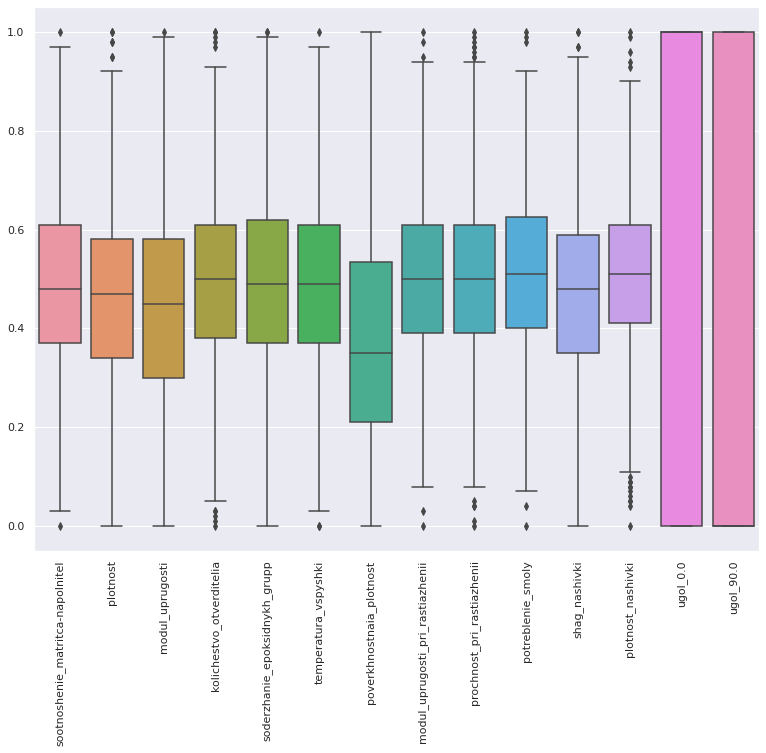

In [ ]:
sns.set(rc={'figure.figsize' : (13,10)})
ax = sns.boxplot(data = df_drop_norm)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

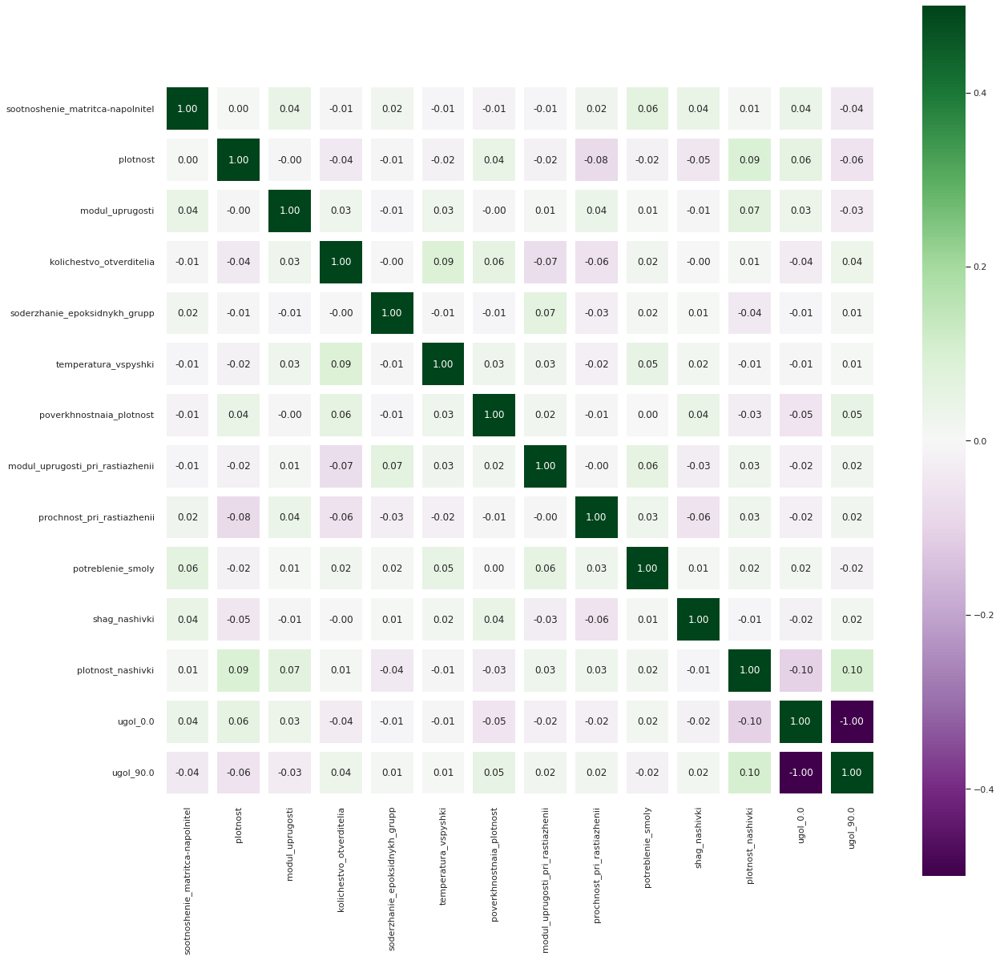

In [ ]:
fig, ax = plt.subplots(figsize = (20, 20))
sns.heatmap(df_drop_norm.corr(), vmin = -0.5, vmax = 0.5, annot=True, square = True, fmt = '.2f', cmap = 'PRGn', ax = ax, linewidths = 10)
plt.show()

## Определение целевых значений и разделение датасета на тренировочный и тестовый

В рамках рассматриваемой задачи целевыми значениями, которые необходимо предсказать являются:

Модуль упругости при растяжении, ГПа	

Прочность при растяжении, МПа

Рассмотрим, какая из моделей даст лучший результат.

mupr - Модуль упругости при растяжении

ppr - Прочность при растяжении



In [ ]:
#целевые переменные
mupr = df_drop_norm.modul_uprugosti_pri_rastiazhenii
ppr = df_drop_norm.prochnost_pri_rastiazhenii

In [ ]:
#датасет без целевых переменных
df_drop_norm = df_drop_norm.drop(['modul_uprugosti_pri_rastiazhenii', 'prochnost_pri_rastiazhenii'], axis = 1)

In [ ]:
#Делим датасет на обучающую и тестовую выборки
x_train_mupr, x_test_mupr, y_train_mupr, y_test_mupr = train_test_split(df_drop_norm, mupr, test_size=0.3)
x_train_ppr, x_test_ppr, y_train_ppr, y_test_ppr = train_test_split(df_drop_norm, ppr, test_size=0.3)

Датасет ошибок

In [ ]:
errors_df = pd.DataFrame(columns=['target_var', 'model_name', 'MSE', 'R2'])

In [ ]:
#Функция визуализации
def aapd(orig, pred, var, model_name):
  plt.figure(figsize = (20, 10))
  plt.title(f'Тестовые и прогнозные значения : {model_name}')
  plt.plot(orig, label = 'Тест')
  plt.plot(pred, label = 'Прогноз')
  plt.legend(loc='best')
  plt.ylabel(var)
  plt.xlabel('Количество наблюдений')
  plt.show()

##Линейная регрессия

In [ ]:
#функция линейной регрессии
def lin_reg(x_train, y_train, x_test, y_test):
  lin_reg_mod = LinearRegression()
  lin_reg_mod.fit(x_train, y_train)
  prediction = lin_reg_mod.predict(x_test)
  MSE = mean_squared_error(y_test, prediction)
  R2 = r2_score(y_test, prediction)
  return lin_reg_mod, prediction, MSE, R2

In [ ]:
# Модуль упругости при растяжении
linear_model_mupr, lm_pred_mupr, lm_MSE_mupr, lm_R2_mupr = lin_reg(x_train_mupr, y_train_mupr, x_test_mupr, y_test_mupr) 

In [ ]:
#Прочность при растяжении
linear_model_ppr, lm_pred_ppr, lm_MSE_ppr, lm_R2_ppr = lin_reg(x_train_ppr,  y_train_ppr, x_test_ppr, y_test_ppr) 

In [ ]:
lm_MSE_mupr, lm_R2_mupr

(0.028720838059997676, -0.0037037191751676524)

In [ ]:
lm_MSE_ppr, lm_R2_ppr

(0.03108604515075683, 0.004675902693325629)

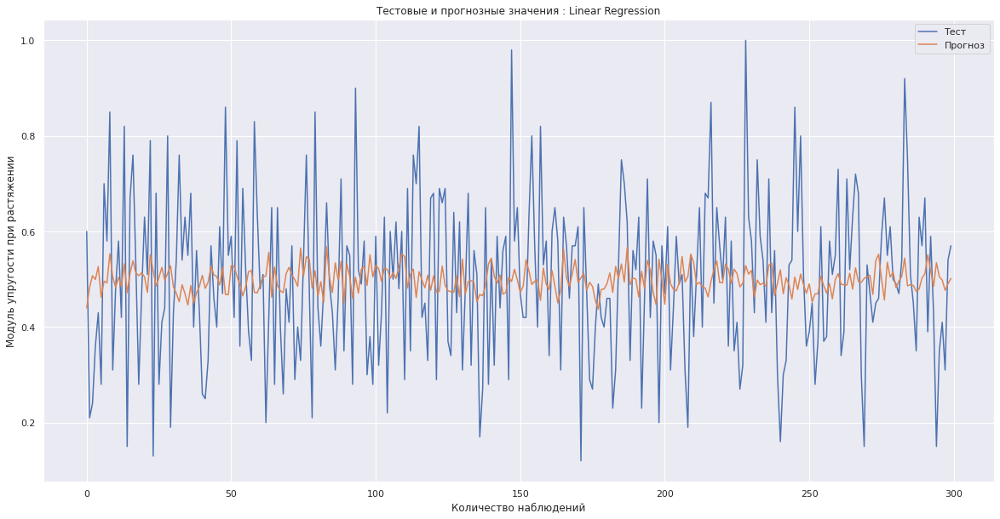

In [ ]:
aapd(y_test_mupr.values, lm_pred_mupr, 'Модуль упругости при растяжении', 'Linear Regression')

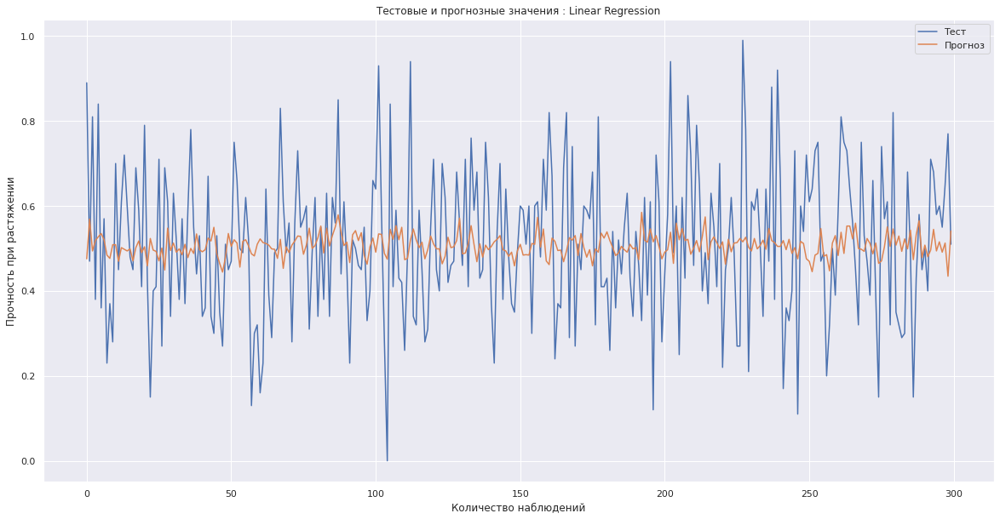

In [ ]:
aapd(y_test_ppr.values, lm_pred_ppr, 'Прочность при растяжении', 'Linear Regression')

In [ ]:
linear_errors = pd.DataFrame({'target_var' : ['Модуль упругости при растяжении', 'Прочность при растяжении'], 'model_name' : 'Linear Regression', 'MSE' : [lm_MSE_mupr, lm_MSE_ppr], 'R2': [lm_R2_mupr, lm_R2_ppr]})

In [ ]:
errors_df = pd.concat([errors_df, linear_errors], ignore_index=True)
errors_df

,target_var,model_name,MSE,R2
0,Модуль упругости при растяжении,Linear Regression,0.028721,-0.003704
1,Прочность при растяжении,Linear Regression,0.031086,0.004676


##Градиентный бустинг

###Градиентный бустинг sklearn

In [ ]:
params_gbr = {'n_estimators': range(1, 100, 5),
          'max_depth': range(1, 10),
          'criterion':['squared_error']
          }
gbr = GradientBoostingRegressor()
GSCV_gbr_mupr = GridSearchCV(gbr, params_gbr, cv=5, verbose=2)
GSCV_gbr_mupr.fit(x_train_mupr, y_train_mupr)
GSCV_gbr_mupr.best_params_
gbr_model_mupr = GSCV_gbr_mupr.best_estimator_
gbr_model_pred_mupr = gbr_model_mupr.predict(x_test_mupr)
gbr_MSE_mupr = mean_squared_error(y_test_mupr, gbr_model_pred_mupr)
gbr_R2_mupr = r2_score(y_test_mupr, gbr_model_pred_mupr)

Fitting 5 folds for each of 180 candidates, totalling 900 fits
[CV] END criterion=squared_error, max_depth=1, n_estimators=1; total time=   0.0s
[CV] END criterion=squared_error, max_depth=1, n_estimators=1; total time=   0.0s
[CV] END criterion=squared_error, max_depth=1, n_estimators=1; total time=   0.0s
[CV] END criterion=squared_error, max_depth=1, n_estimators=1; total time=   0.0s
[CV] END criterion=squared_error, max_depth=1, n_estimators=1; total time=   0.0s
[CV] END criterion=squared_error, max_depth=1, n_estimators=6; total time=   0.0s
[CV] END criterion=squared_error, max_depth=1, n_estimators=6; total time=   0.0s
[CV] END criterion=squared_error, max_depth=1, n_estimators=6; total time=   0.0s
[CV] END criterion=squared_error, max_depth=1, n_estimators=6; total time=   0.0s
[CV] END criterion=squared_error, max_depth=1, n_estimators=6; total time=   0.0s
[CV] END criterion=squared_error, max_depth=1, n_estimators=11; total time=   0.0s
[CV] END criterion=squared_error, 

In [ ]:
GSCV_gbr_ppr = GridSearchCV(gbr, params_gbr, cv=5, verbose=2)
GSCV_gbr_ppr.fit(x_train_ppr, y_train_ppr)
GSCV_gbr_ppr.best_params_
gbr_model_ppr = GSCV_gbr_ppr.best_estimator_
gbr_model_pred_ppr = gbr_model_ppr.predict(x_test_ppr)
gbr_MSE_ppr = mean_squared_error(y_test_ppr, gbr_model_pred_ppr)
gbr_R2_ppr = r2_score(y_test_ppr, gbr_model_pred_ppr)

Fitting 5 folds for each of 180 candidates, totalling 900 fits
[CV] END criterion=squared_error, max_depth=1, n_estimators=1; total time=   0.0s
[CV] END criterion=squared_error, max_depth=1, n_estimators=1; total time=   0.0s
[CV] END criterion=squared_error, max_depth=1, n_estimators=1; total time=   0.0s
[CV] END criterion=squared_error, max_depth=1, n_estimators=1; total time=   0.0s
[CV] END criterion=squared_error, max_depth=1, n_estimators=1; total time=   0.0s
[CV] END criterion=squared_error, max_depth=1, n_estimators=6; total time=   0.0s
[CV] END criterion=squared_error, max_depth=1, n_estimators=6; total time=   0.0s
[CV] END criterion=squared_error, max_depth=1, n_estimators=6; total time=   0.0s
[CV] END criterion=squared_error, max_depth=1, n_estimators=6; total time=   0.0s
[CV] END criterion=squared_error, max_depth=1, n_estimators=6; total time=   0.0s
[CV] END criterion=squared_error, max_depth=1, n_estimators=11; total time=   0.0s
[CV] END criterion=squared_error, 

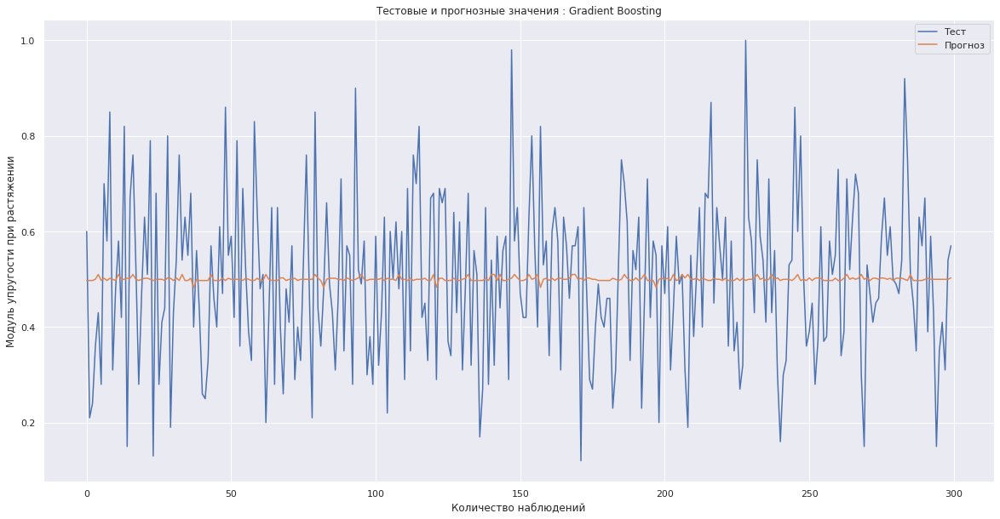

In [ ]:
aapd(y_test_mupr.values, gbr_model_pred_mupr, 'Модуль упругости при растяжении', 'Gradient Boosting')

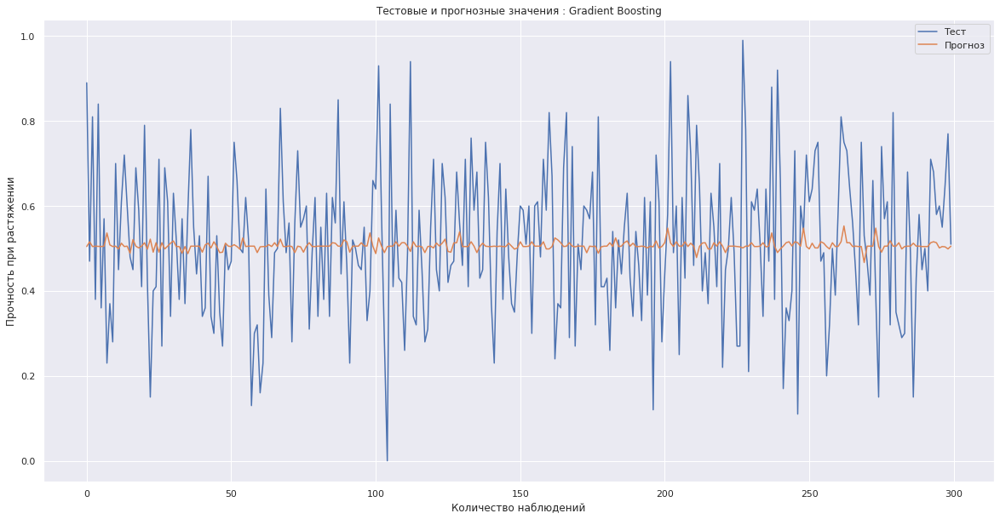

In [ ]:
aapd(y_test_ppr.values, gbr_model_pred_ppr, 'Прочность при растяжении', 'Gradient Boosting')

In [ ]:
gbr_errors = pd.DataFrame({'target_var' : ['Модуль упругости при растяжении', 'Прочность при растяжении'], 'model_name' : 'Gradient Boosting', 'MSE' : [gbr_MSE_mupr, gbr_MSE_ppr], 'R2': [gbr_R2_mupr, gbr_R2_ppr]})

In [ ]:
errors_df = pd.concat([errors_df, gbr_errors], ignore_index=True)
errors_df

,target_var,model_name,MSE,R2
0,Модуль упругости при растяжении,Linear Regression,0.028721,-0.003704
1,Прочность при растяжении,Linear Regression,0.031086,0.004676
2,Модуль упругости при растяжении,Gradient Boosting,0.028560,0.001912
3,Прочность при растяжении,Gradient Boosting,0.031410,-0.005704


#Градиентный бустинг LightGBM

In [ ]:
lgbm_reg = lgbm.LGBMRegressor()

In [ ]:
lgbm_params= {
    'n_estimators': range(1,200,20),
    'max_depth': range(1, 15, 2),
    'num_leaves': range(1,30,5),
}

In [ ]:
GSCV_lgbm_mupr = GridSearchCV(lgbm_reg, lgbm_params, cv = 5, verbose = 2)
GSCV_lgbm_mupr.fit(x_train_mupr, y_train_mupr)

Fitting 5 folds for each of 420 candidates, totalling 2100 fits
[CV] END ..........max_depth=1, n_estimators=1, num_leaves=1; total time=   0.0s
[CV] END ..........max_depth=1, n_estimators=1, num_leaves=1; total time=   0.0s
[CV] END ..........max_depth=1, n_estimators=1, num_leaves=1; total time=   0.0s
[CV] END ..........max_depth=1, n_estimators=1, num_leaves=1; total time=   0.0s
[CV] END ..........max_depth=1, n_estimators=1, num_leaves=1; total time=   0.0s
[CV] END ..........max_depth=1, n_estimators=1, num_leaves=6; total time=   0.0s
[CV] END ..........max_depth=1, n_estimators=1, num_leaves=6; total time=   0.0s
[CV] END ..........max_depth=1, n_estimators=1, num_leaves=6; total time=   0.0s
[CV] END ..........max_depth=1, n_estimators=1, num_leaves=6; total time=   0.0s
[CV] END ..........max_depth=1, n_estimators=1, num_leaves=6; total time=   0.0s
[CV] END .........max_depth=1, n_estimators=1, num_leaves=11; total time=   0.0s
[CV] END .........max_depth=1, n_estimators=1

/usr/local/lib/python3.8/dist-packages/sklearn/model_selection/_validation.py:372: FitFailedWarning: 
350 fits failed out of a total of 2100.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
350 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.8/dist-packages/lightgbm/engine.py", line 197, in train
    booster = Booster(params=params, train_set=train_set)
  File "/usr/local/lib/python3.8/dist-packages/lightgbm/basic.py", line 1552, in __init__
    train_set.construct().handle,
  File "/usr/local/lib/python3.8/dist-packages/lightgbm/basic.py", line 997, in construct
    self._lazy_init(self.data, label=self.label,
  File "/usr/local/lib/python3.8/dist-packages/lightgbm/basic.py", line 

GridSearchCV(cv=5, estimator=LGBMRegressor(),
             param_grid={'max_depth': range(1, 15, 2),
                         'n_estimators': range(1, 200, 20),
                         'num_leaves': range(1, 30, 5)},
             verbose=2)

In [ ]:
lgbm_mupr = GSCV_lgbm_mupr.best_estimator_
lgbm_mupr_predict = lgbm_mupr.predict(x_test_mupr)

In [ ]:
lgbm_MSE_mupr = mean_squared_error(y_test_mupr, lgbm_mupr_predict)
lgbm_MSE_mupr
lgbm_R2_mupr = r2_score(y_test_mupr, lgbm_mupr_predict)
lgbm_R2_mupr

0.0001004121059395846

In [ ]:
GSCV_lgbm_ppr = GridSearchCV(lgbm_reg, lgbm_params, cv = 5, verbose = 2)
GSCV_lgbm_ppr.fit(x_train_ppr, y_train_ppr)

Fitting 5 folds for each of 420 candidates, totalling 2100 fits
[CV] END ..........max_depth=1, n_estimators=1, num_leaves=1; total time=   0.0s
[CV] END ..........max_depth=1, n_estimators=1, num_leaves=1; total time=   0.0s
[CV] END ..........max_depth=1, n_estimators=1, num_leaves=1; total time=   0.0s
[CV] END ..........max_depth=1, n_estimators=1, num_leaves=1; total time=   0.0s
[CV] END ..........max_depth=1, n_estimators=1, num_leaves=1; total time=   0.0s
[CV] END ..........max_depth=1, n_estimators=1, num_leaves=6; total time=   0.0s
[CV] END ..........max_depth=1, n_estimators=1, num_leaves=6; total time=   0.0s
[CV] END ..........max_depth=1, n_estimators=1, num_leaves=6; total time=   0.0s
[CV] END ..........max_depth=1, n_estimators=1, num_leaves=6; total time=   0.0s
[CV] END ..........max_depth=1, n_estimators=1, num_leaves=6; total time=   0.0s
[CV] END .........max_depth=1, n_estimators=1, num_leaves=11; total time=   0.0s
[CV] END .........max_depth=1, n_estimators=1

/usr/local/lib/python3.8/dist-packages/sklearn/model_selection/_validation.py:372: FitFailedWarning: 
350 fits failed out of a total of 2100.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
350 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.8/dist-packages/lightgbm/engine.py", line 197, in train
    booster = Booster(params=params, train_set=train_set)
  File "/usr/local/lib/python3.8/dist-packages/lightgbm/basic.py", line 1552, in __init__
    train_set.construct().handle,
  File "/usr/local/lib/python3.8/dist-packages/lightgbm/basic.py", line 997, in construct
    self._lazy_init(self.data, label=self.label,
  File "/usr/local/lib/python3.8/dist-packages/lightgbm/basic.py", line 

GridSearchCV(cv=5, estimator=LGBMRegressor(),
             param_grid={'max_depth': range(1, 15, 2),
                         'n_estimators': range(1, 200, 20),
                         'num_leaves': range(1, 30, 5)},
             verbose=2)

In [ ]:
lgbm_ppr = GSCV_lgbm_ppr.best_estimator_
lgbm_ppr_predict = lgbm_ppr.predict(x_test_ppr)

In [ ]:
lgbm_MSE_ppr = mean_squared_error(y_test_ppr, lgbm_ppr_predict)
lgbm_R2_ppr = r2_score(y_test_ppr, lgbm_ppr_predict)
lgbm_MSE_ppr, lgbm_R2_ppr

(0.031242349293263912, -0.00032869917197042575)

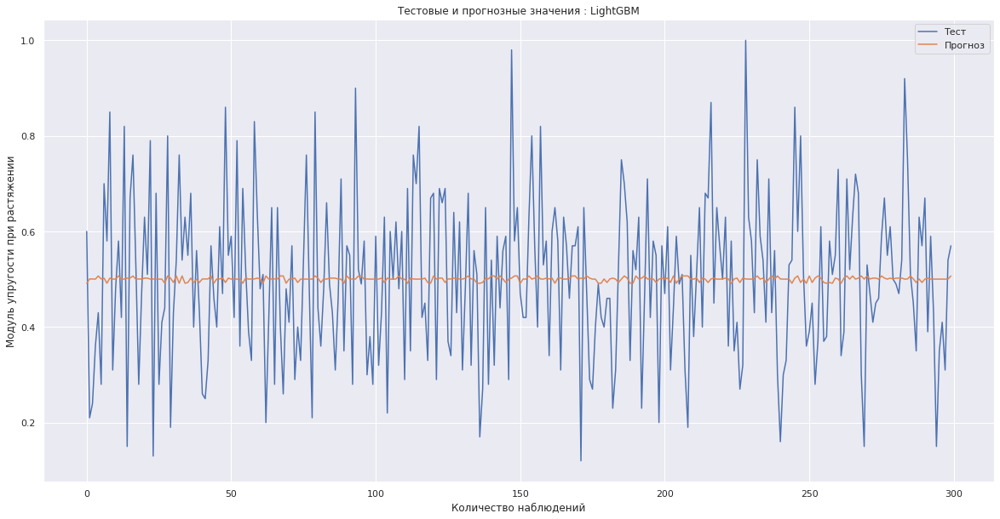

In [ ]:
aapd(y_test_mupr.values, lgbm_mupr_predict, 'Модуль упругости при растяжении', 'LightGBM')

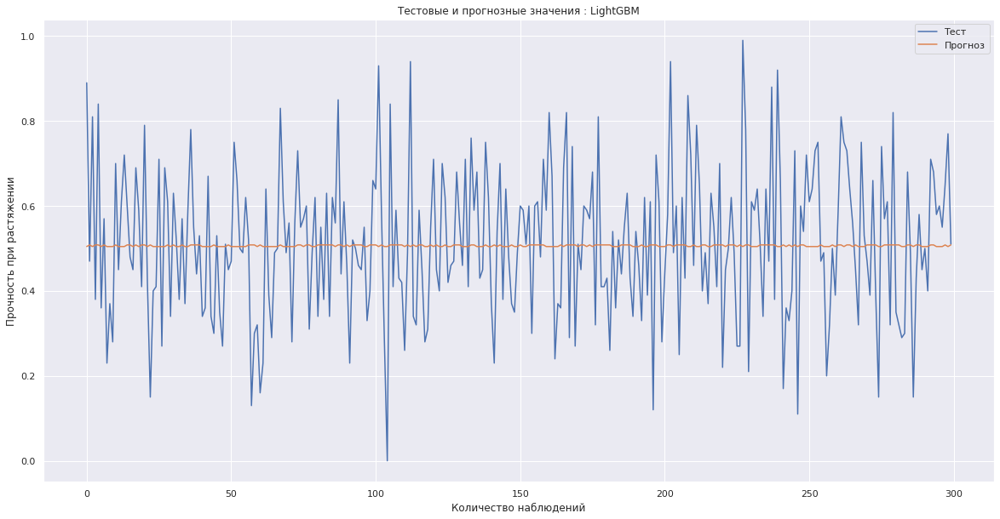

In [ ]:
aapd(y_test_ppr.values, lgbm_ppr_predict, 'Прочность при растяжении', 'LightGBM')

In [ ]:
lgbm_errors = pd.DataFrame({'target_var' : ['Модуль упругости при растяжении', 'Прочность при растяжении'], 'model_name' : 'LightGBM', 'MSE' : [lgbm_MSE_mupr, lgbm_MSE_ppr], 'R2': [lgbm_R2_mupr, lgbm_R2_ppr]})
errors_df = pd.concat([errors_df, lgbm_errors], ignore_index=True)
errors_df

,target_var,model_name,MSE,R2
0,Модуль упругости при растяжении,Linear Regression,0.028721,-0.003704
1,Прочность при растяжении,Linear Regression,0.031086,0.004676
2,Модуль упругости при растяжении,Gradient Boosting,0.028560,0.001912
3,Прочность при растяжении,Gradient Boosting,0.031410,-0.005704
4,Модуль упругости при растяжении,LightGBM,0.028612,0.000100
5,Прочность при растяжении,LightGBM,0.031242,-0.000329


###Градиентный бустинг XGBoost

In [ ]:
xgboost = xgb.XGBRegressor()
xgboost_params = {
    'n_estimators': range(1,200,20),
    'max_depth': range(1, 15, 2),
    'num_leaves': range(1,30,5),
}

In [ ]:
GSCV_xgboost_mupr = GridSearchCV(xgboost, xgboost_params, cv = 5, verbose = 2)
GSCV_xgboost_mupr.fit(x_train_mupr, y_train_mupr)

Fitting 5 folds for each of 420 candidates, totalling 2100 fits
[14:34:46] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[CV] END ..........max_depth=1, n_estimators=1, num_leaves=1; total time=   1.2s
[14:34:47] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[CV] END ..........max_depth=1, n_estimators=1, num_leaves=1; total time=   0.0s
[14:34:47] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[CV] END ..........max_depth=1, n_estimators=1, num_leaves=1; total time=   0.0s
[14:34:47] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[CV] END ..........max_depth=1, n_estimators=1, num_leaves=1; total time=   0.0s
[14:34:47] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favo

GridSearchCV(cv=5, estimator=XGBRegressor(),
             param_grid={'max_depth': range(1, 15, 2),
                         'n_estimators': range(1, 200, 20),
                         'num_leaves': range(1, 30, 5)},
             verbose=2)

In [ ]:
xgboost_mupr = GSCV_xgboost_mupr.best_estimator_
xgboost_mupr_predict = xgboost_mupr.predict(x_test_mupr)

In [ ]:
xgboost_MSE_mupr = mean_squared_error(y_test_mupr, xgboost_mupr_predict)
xgboost_R2_mupr = r2_score(y_test_mupr, xgboost_mupr_predict)
xgboost_MSE_mupr, xgboost_R2_mupr

(0.028430782715363374, 0.0064328105308220085)

In [ ]:
GSCV_xgboost_ppr = GridSearchCV(xgboost, xgboost_params, cv = 5, verbose = 2)
GSCV_xgboost_ppr.fit(x_train_ppr, y_train_ppr)

Fitting 5 folds for each of 420 candidates, totalling 2100 fits
[14:38:07] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[CV] END ..........max_depth=1, n_estimators=1, num_leaves=1; total time=   0.0s
[14:38:07] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[CV] END ..........max_depth=1, n_estimators=1, num_leaves=1; total time=   0.0s
[14:38:07] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[CV] END ..........max_depth=1, n_estimators=1, num_leaves=1; total time=   0.0s
[14:38:07] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[CV] END ..........max_depth=1, n_estimators=1, num_leaves=1; total time=   0.0s
[14:38:07] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favo

GridSearchCV(cv=5, estimator=XGBRegressor(),
             param_grid={'max_depth': range(1, 15, 2),
                         'n_estimators': range(1, 200, 20),
                         'num_leaves': range(1, 30, 5)},
             verbose=2)

In [ ]:
xgboost_ppr = GSCV_xgboost_ppr.best_estimator_
xgboost_ppr_predict = xgboost_ppr.predict(x_test_ppr)

In [ ]:
xgboost_MSE_ppr = mean_squared_error(y_test_ppr, xgboost_ppr_predict)
xgboost_R2_ppr = r2_score(y_test_ppr, xgboost_ppr_predict)
xgboost_MSE_ppr, xgboost_R2_ppr

(0.031201890083257713, 0.0009667382656922685)

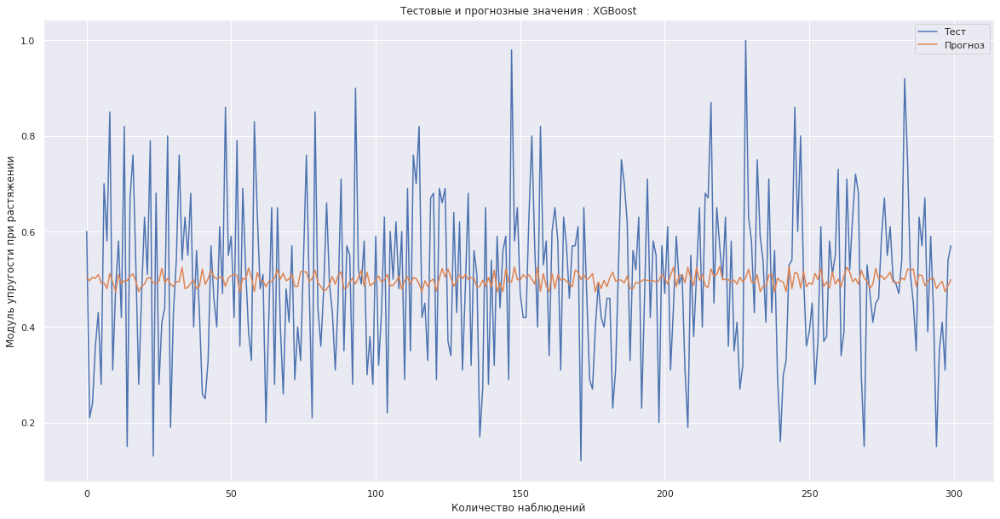

In [ ]:
aapd(y_test_mupr.values, xgboost_mupr_predict, 'Модуль упругости при растяжении', 'XGBoost')


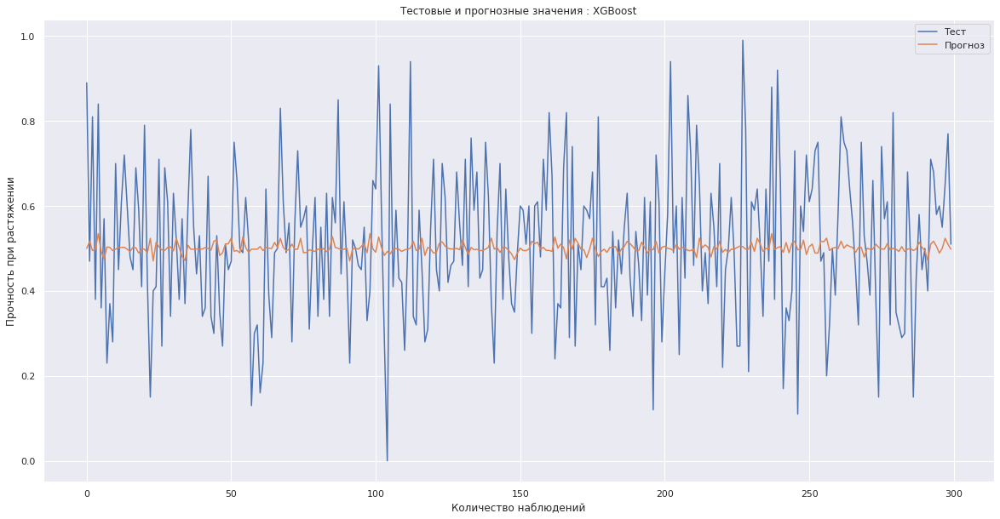

In [ ]:
aapd(y_test_ppr.values, xgboost_ppr_predict, 'Прочность при растяжении', 'XGBoost')

In [ ]:
xgboost_errors = pd.DataFrame({'target_var' : ['Модуль упругости при растяжении', 'Прочность при растяжении'], 'model_name' : 'XGBoost', 'MSE' : [xgboost_MSE_mupr, xgboost_MSE_ppr], 'R2': [xgboost_R2_mupr, xgboost_R2_ppr]})
errors_df = pd.concat([errors_df, xgboost_errors], ignore_index=True)
errors_df

,target_var,model_name,MSE,R2
0,Модуль упругости при растяжении,Linear Regression,0.028721,-0.003704
1,Прочность при растяжении,Linear Regression,0.031086,0.004676
2,Модуль упругости при растяжении,Gradient Boosting,0.028560,0.001912
3,Прочность при растяжении,Gradient Boosting,0.031410,-0.005704
4,Модуль упругости при растяжении,LightGBM,0.028612,0.000100
5,Прочность при растяжении,LightGBM,0.031242,-0.000329
6,Модуль упругости при растяжении,XGBoost,0.028431,0.006433
7,Прочность при растяжении,XGBoost,0.031202,0.000967


##Случайный лес(Random Forest)

In [ ]:
rfr = RandomForestRegressor()
rfr_params = {
    'n_estimators' : range(1, 100, 5),
    'max_features' : ['auto', 'sqrt', 'log2'],
    'max_depth' : [1, 5, 1],
    'criterion' : ['squared_error']
}

In [ ]:
GSCV_rfr_mupr = GridSearchCV(rfr, rfr_params, cv = 5, verbose=2)
GSCV_rfr_mupr.fit(x_train_mupr, y_train_mupr)

Fitting 5 folds for each of 180 candidates, totalling 900 fits
[CV] END criterion=squared_error, max_depth=1, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=squared_error, max_depth=1, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=squared_error, max_depth=1, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=squared_error, max_depth=1, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=squared_error, max_depth=1, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=squared_error, max_depth=1, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=squared_error, max_depth=1, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=squared_error, max_depth=1, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=squared_error, max_depth=1, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=squared_e

GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'criterion': ['squared_error'], 'max_depth': [1, 5, 1],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'n_estimators': range(1, 100, 5)},
             verbose=2)

In [ ]:
rfr_mupr = GSCV_rfr_mupr.best_estimator_
rfr_mupr_predict = rfr_mupr.predict(x_test_mupr)

In [ ]:
rfr_MSE_mupr = mean_squared_error(y_test_mupr, rfr_mupr_predict)
rfr_R2_mupr = r2_score(y_test_mupr, rfr_mupr_predict)
rfr_MSE_mupr, rfr_R2_mupr

(0.028702479198408747, -0.003062134217996837)

In [ ]:
GSCV_rfr_ppr = GridSearchCV(rfr, rfr_params, cv = 5, verbose=2)
GSCV_rfr_ppr.fit(x_train_ppr, y_train_ppr)

Fitting 5 folds for each of 180 candidates, totalling 900 fits
[CV] END criterion=squared_error, max_depth=1, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=squared_error, max_depth=1, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=squared_error, max_depth=1, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=squared_error, max_depth=1, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=squared_error, max_depth=1, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=squared_error, max_depth=1, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=squared_error, max_depth=1, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=squared_error, max_depth=1, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=squared_error, max_depth=1, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=squared_e

GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'criterion': ['squared_error'], 'max_depth': [1, 5, 1],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'n_estimators': range(1, 100, 5)},
             verbose=2)

In [ ]:
rfr_ppr = GSCV_rfr_ppr.best_estimator_
rfr_ppr_predict = rfr_ppr.predict(x_test_ppr)
rfr_MSE_ppr = mean_squared_error(y_test_ppr, rfr_ppr_predict)
rfr_R2_ppr = r2_score(y_test_ppr, rfr_ppr_predict)
rfr_MSE_ppr, rfr_R2_ppr

(0.031055526469805996, 0.005653060721021674)

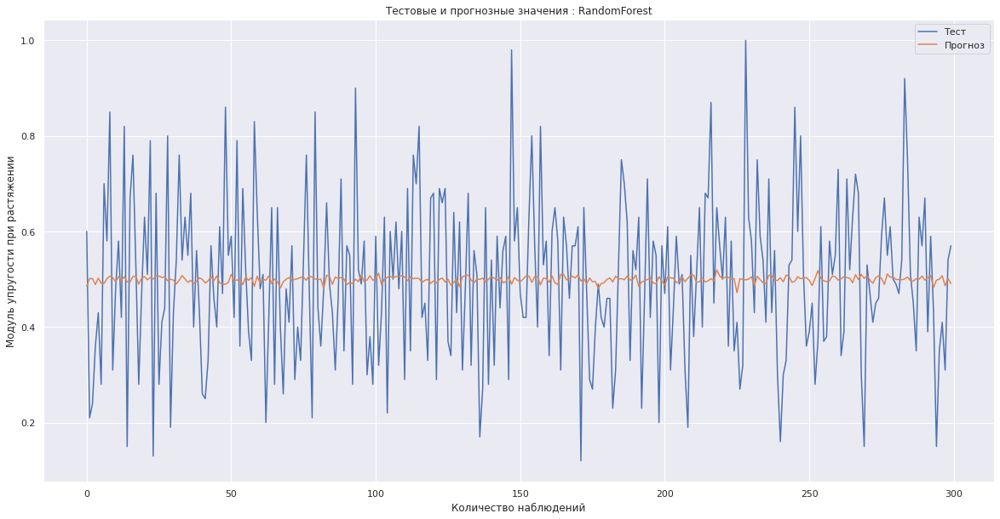

In [ ]:
aapd(y_test_mupr.values, rfr_mupr_predict, 'Модуль упругости при растяжении', 'RandomForest')

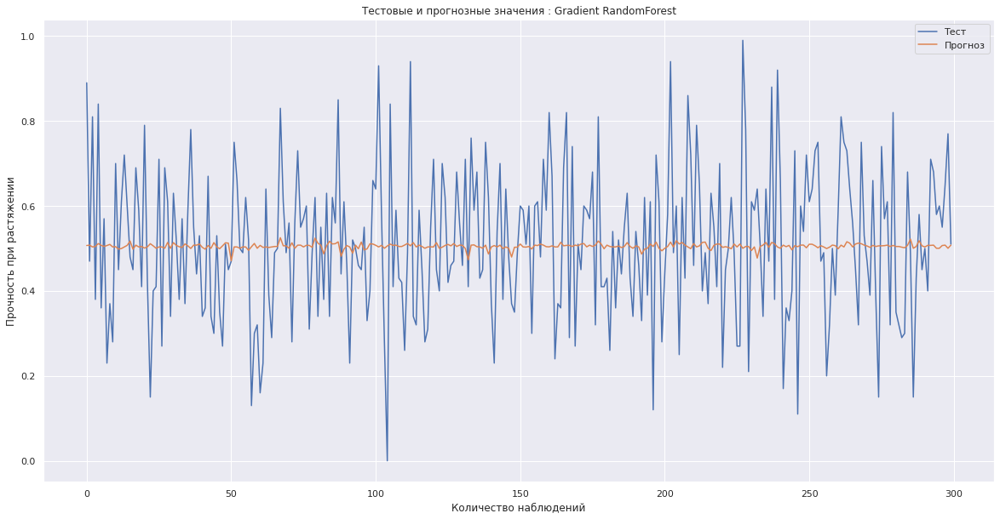

In [ ]:
aapd(y_test_ppr.values, rfr_ppr_predict, 'Прочность при растяжении', 'Gradient RandomForest')

In [ ]:
rfr_errors = pd.DataFrame({'target_var' : ['Модуль упругости при растяжении', 'Прочность при растяжении'], 'model_name' : 'RandomForest', 'MSE' : [rfr_MSE_mupr, rfr_MSE_ppr], 'R2': [rfr_R2_mupr, rfr_R2_ppr]})
errors_df = pd.concat([errors_df, rfr_errors], ignore_index=True)
errors_df

,target_var,model_name,MSE,R2
0,Модуль упругости при растяжении,Linear Regression,0.028721,-0.003704
1,Прочность при растяжении,Linear Regression,0.031086,0.004676
2,Модуль упругости при растяжении,Gradient Boosting,0.028560,0.001912
3,Прочность при растяжении,Gradient Boosting,0.031410,-0.005704
4,Модуль упругости при растяжении,LightGBM,0.028612,0.000100
5,Прочность при растяжении,LightGBM,0.031242,-0.000329
6,Модуль упругости при растяжении,XGBoost,0.028431,0.006433
7,Прочность при растяжении,XGBoost,0.031202,0.000967
8,Модуль упругости при растяжении,RandomForest,0.028702,-0.003062
9,Прочность при растяжении,RandomForest,0.031056,0.005653


##Регрессия к-ближайших соседей

In [ ]:
knr = KNeighborsRegressor()
knr_params = {
    'n_neighbors' : range(1, 100),
    'weights' : ['uniform', 'distance'],
    'algorithm' : ['auto', 'ball_tree', 'kd_tree', 'brute']
}
GSCV_knr = GridSearchCV(knr, knr_params, n_jobs = -1, cv=10)


In [ ]:
GSCV_knr.fit(x_train_mupr, y_train_mupr)

GridSearchCV(cv=10, estimator=KNeighborsRegressor(), n_jobs=-1,
             param_grid={'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
                         'n_neighbors': range(1, 100),
                         'weights': ['uniform', 'distance']})

In [ ]:
knr_mupr = GSCV_knr.best_estimator_

In [ ]:
knr_mupr_predict = knr_mupr.predict(x_test_mupr)

In [ ]:
knr_MSE_mupr = mean_squared_error(y_test_mupr, knr_mupr_predict)
knr_MSE_mupr

0.028171782123498777

In [ ]:
knr_R2_mupr = r2_score(y_test_mupr, knr_mupr_predict)
knr_R2_mupr

0.015484073477258664

In [ ]:
GSCV_knr.fit(x_train_ppr, y_train_ppr)

GridSearchCV(cv=10, estimator=KNeighborsRegressor(), n_jobs=-1,
             param_grid={'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
                         'n_neighbors': range(1, 100),
                         'weights': ['uniform', 'distance']})

In [ ]:
knr_ppr = GSCV_knr.best_estimator_

In [ ]:
knr_ppr_predict = knr_ppr.predict(x_test_ppr)

In [ ]:
knr_MSE_ppr = mean_squared_error(y_test_ppr, knr_ppr_predict)
knr_MSE_ppr

0.031093259002057613

In [ ]:
knr_R2_ppr = r2_score(y_test_ppr, knr_ppr_predict)
knr_R2_ppr

0.004444927025651246

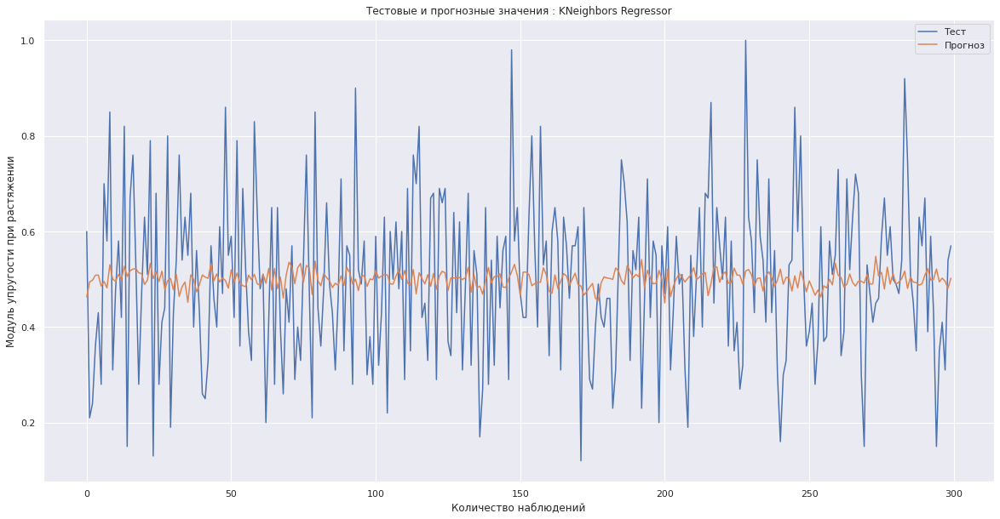

In [ ]:
aapd(y_test_mupr.values, knr_mupr_predict, 'Модуль упругости при растяжении', 'KNeighbors Regressor')

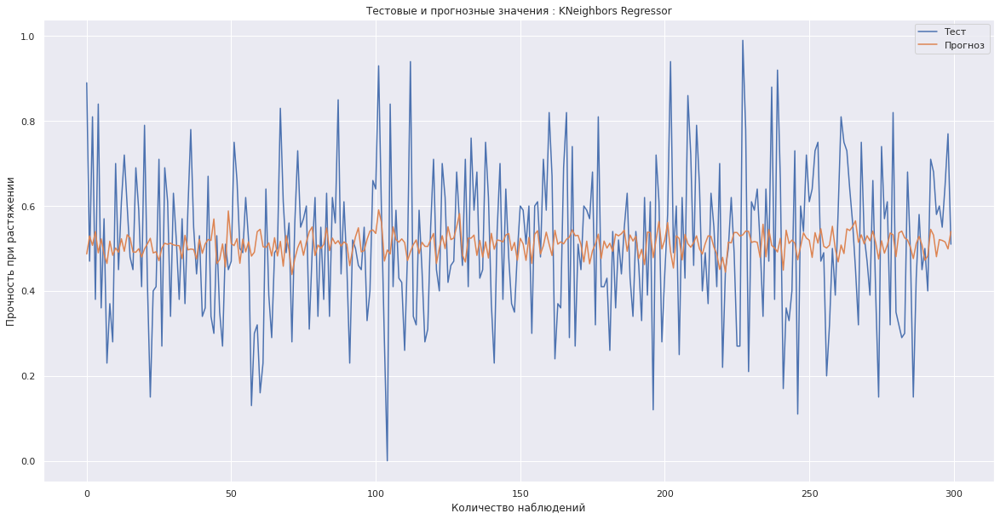

In [ ]:
aapd(y_test_ppr.values, knr_ppr_predict, 'Прочность при растяжении', 'KNeighbors Regressor')

In [ ]:
rfr_errors = pd.DataFrame({'target_var' : ['Модуль упругости при растяжении', 'Прочность при растяжении'], 'model_name' : 'KNeighborsRegressor', 'MSE' : [knr_MSE_mupr, knr_MSE_ppr], 'R2': [knr_R2_mupr, knr_R2_ppr]})
errors_df = pd.concat([errors_df, rfr_errors], ignore_index=True)
errors_df

,target_var,model_name,MSE,R2
0,Модуль упругости при растяжении,Linear Regression,0.028721,-0.003704
1,Прочность при растяжении,Linear Regression,0.031086,0.004676
2,Модуль упругости при растяжении,Gradient Boosting,0.028560,0.001912
3,Прочность при растяжении,Gradient Boosting,0.031410,-0.005704
4,Модуль упругости при растяжении,LightGBM,0.028612,0.000100
5,Прочность при растяжении,LightGBM,0.031242,-0.000329
6,Модуль упругости при растяжении,XGBoost,0.028431,0.006433
7,Прочность при растяжении,XGBoost,0.031202,0.000967
8,Модуль упругости при растяжении,RandomForest,0.028702,-0.003062
9,Прочность при растяжении,RandomForest,0.031056,0.005653


##Лассо регрессия

In [ ]:
lasso_model = Lasso()
lasso_params = {
    'alpha' : np.linspace(0, 1, 100)
}


In [ ]:
GSCV_lasso_mupr = GridSearchCV(lasso_model, lasso_params, cv = 5, verbose = 2)
GSCV_lasso_mupr.fit(x_train_mupr, y_train_mupr)


Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.020202020202020204; total time=   0.0s
[CV] END .........................alpha=0.0202

/usr/local/lib/python3.8/dist-packages/sklearn/model_selection/_validation.py:680: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_coordinate_descent.py:647: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.345e+00, tolerance: 1.518e-03 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet

[CV] END ..........................alpha=0.06060606060606061; total time=   0.0s
[CV] END ..........................alpha=0.07070707070707072; total time=   0.0s
[CV] END ..........................alpha=0.07070707070707072; total time=   0.0s
[CV] END ..........................alpha=0.07070707070707072; total time=   0.0s
[CV] END ..........................alpha=0.07070707070707072; total time=   0.0s
[CV] END ..........................alpha=0.07070707070707072; total time=   0.0s
[CV] END ..........................alpha=0.08080808080808081; total time=   0.0s
[CV] END ..........................alpha=0.08080808080808081; total time=   0.0s
[CV] END ..........................alpha=0.08080808080808081; total time=   0.0s
[CV] END ..........................alpha=0.08080808080808081; total time=   0.0s
[CV] END ..........................alpha=0.08080808080808081; total time=   0.0s
[CV] END ..........................alpha=0.09090909090909091; total time=   0.0s
[CV] END ...................

GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': array([0.        , 0.01010101, 0.02020202, 0.03030303, 0.04040404,
       0.05050505, 0.06060606, 0.07070707, 0.08080808, 0.09090909,
       0.1010101 , 0.11111111, 0.12121212, 0.13131313, 0.14141414,
       0.15151515, 0.16161616, 0.17171717, 0.18181818, 0.19191919,
       0.2020202 , 0.21212121, 0.22222222, 0.23232323, 0.24242424,
       0.25252525, 0.26262626,...
       0.65656566, 0.66666667, 0.67676768, 0.68686869, 0.6969697 ,
       0.70707071, 0.71717172, 0.72727273, 0.73737374, 0.74747475,
       0.75757576, 0.76767677, 0.77777778, 0.78787879, 0.7979798 ,
       0.80808081, 0.81818182, 0.82828283, 0.83838384, 0.84848485,
       0.85858586, 0.86868687, 0.87878788, 0.88888889, 0.8989899 ,
       0.90909091, 0.91919192, 0.92929293, 0.93939394, 0.94949495,
       0.95959596, 0.96969697, 0.97979798, 0.98989899, 1.        ])},
             verbose=2)

In [ ]:
lasso_mupr = GSCV_lasso_mupr.best_estimator_
lasso_mupr_predict = lasso_mupr.predict(x_test_mupr)


In [ ]:
lasso_MSE_mupr = mean_squared_error(y_test_mupr, lasso_mupr_predict)
lasso_R2_mupr = r2_score(y_test_mupr, lasso_mupr_predict)
lasso_MSE_mupr, lasso_R2_mupr

(0.02861488102766879, -8.513410501009844e-07)

In [ ]:
GSCV_lasso_ppr = GridSearchCV(lasso_model, lasso_params, cv=5, verbose=2)
GSCV_lasso_ppr.fit(x_train_mupr, y_train_mupr)

Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.020202020202020204; total time=   0.0s
[CV] END .........................alpha=0.0202

/usr/local/lib/python3.8/dist-packages/sklearn/model_selection/_validation.py:680: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_coordinate_descent.py:647: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.345e+00, tolerance: 1.518e-03 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet

[CV] END ..........................alpha=0.07070707070707072; total time=   0.0s
[CV] END ..........................alpha=0.07070707070707072; total time=   0.0s
[CV] END ..........................alpha=0.08080808080808081; total time=   0.0s
[CV] END ..........................alpha=0.08080808080808081; total time=   0.0s
[CV] END ..........................alpha=0.08080808080808081; total time=   0.0s
[CV] END ..........................alpha=0.08080808080808081; total time=   0.0s
[CV] END ..........................alpha=0.08080808080808081; total time=   0.0s
[CV] END ..........................alpha=0.09090909090909091; total time=   0.0s
[CV] END ..........................alpha=0.09090909090909091; total time=   0.0s
[CV] END ..........................alpha=0.09090909090909091; total time=   0.0s
[CV] END ..........................alpha=0.09090909090909091; total time=   0.0s
[CV] END ..........................alpha=0.09090909090909091; total time=   0.0s
[CV] END ...................

GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': array([0.        , 0.01010101, 0.02020202, 0.03030303, 0.04040404,
       0.05050505, 0.06060606, 0.07070707, 0.08080808, 0.09090909,
       0.1010101 , 0.11111111, 0.12121212, 0.13131313, 0.14141414,
       0.15151515, 0.16161616, 0.17171717, 0.18181818, 0.19191919,
       0.2020202 , 0.21212121, 0.22222222, 0.23232323, 0.24242424,
       0.25252525, 0.26262626,...
       0.65656566, 0.66666667, 0.67676768, 0.68686869, 0.6969697 ,
       0.70707071, 0.71717172, 0.72727273, 0.73737374, 0.74747475,
       0.75757576, 0.76767677, 0.77777778, 0.78787879, 0.7979798 ,
       0.80808081, 0.81818182, 0.82828283, 0.83838384, 0.84848485,
       0.85858586, 0.86868687, 0.87878788, 0.88888889, 0.8989899 ,
       0.90909091, 0.91919192, 0.92929293, 0.93939394, 0.94949495,
       0.95959596, 0.96969697, 0.97979798, 0.98989899, 1.        ])},
             verbose=2)

In [ ]:
lasso_ppr = GSCV_lasso_ppr.best_estimator_
lasso_ppr_predict = lasso_ppr.predict(x_test_ppr)

In [ ]:
lasso_MSE_ppr = mean_squared_error(y_test_ppr, lasso_ppr_predict)
lasso_R2_ppr = r2_score(y_test_ppr, lasso_ppr_predict)
lasso_MSE_ppr, lasso_R2_ppr

(0.03137028875299068, -0.00442511049238381)

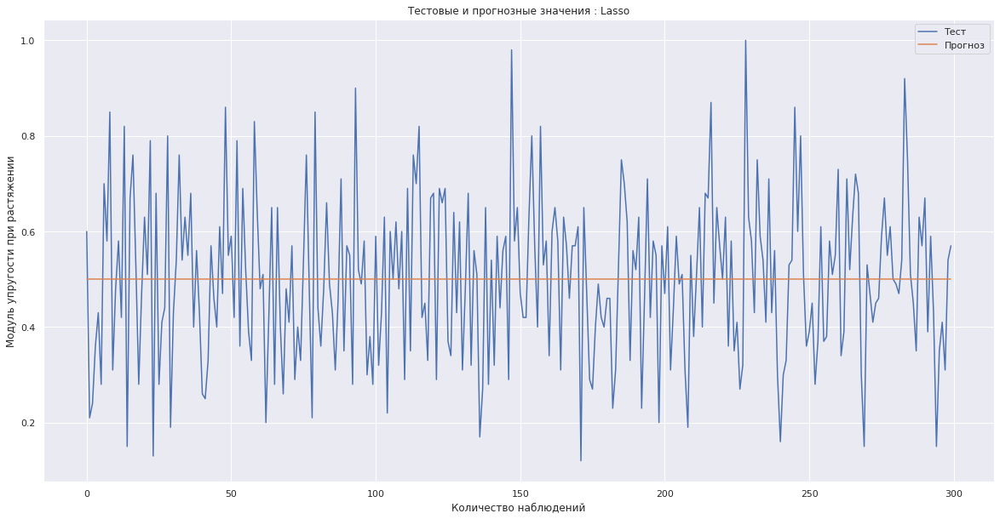

In [ ]:
aapd(y_test_mupr.values, lasso_mupr_predict, 'Модуль упругости при растяжении', 'Lasso')

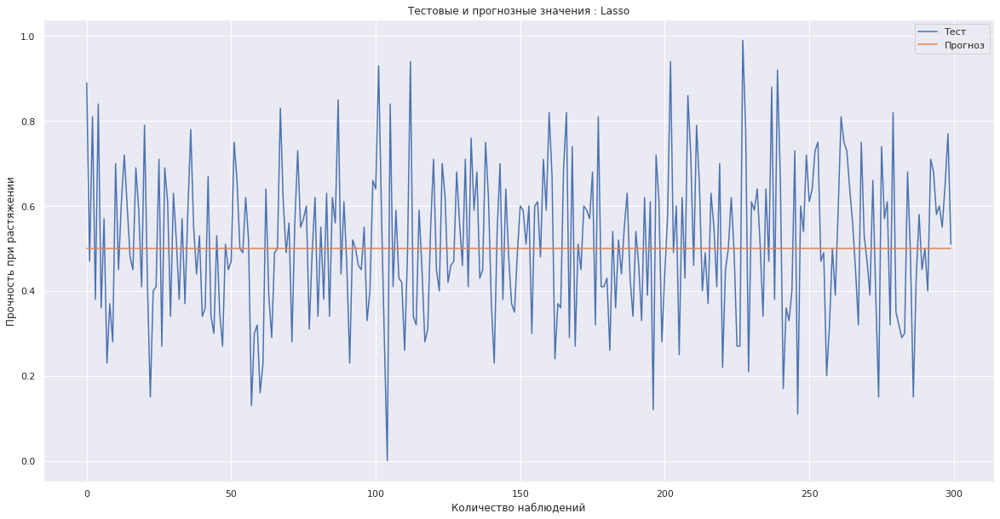

In [ ]:
aapd(y_test_ppr.values, lasso_ppr_predict, 'Прочность при растяжении', 'Lasso')

In [ ]:
lasso_errors = pd.DataFrame({'target_var' : ['Модуль упругости при растяжении', 'Прочность при растяжении'], 'model_name' : 'Lasso', 'MSE' : [lasso_MSE_mupr, lasso_MSE_ppr], 'R2': [lasso_R2_mupr, lasso_R2_ppr]})
errors_df = pd.concat([errors_df, lasso_errors], ignore_index=True)
errors_df

,target_var,model_name,MSE,R2
0,Модуль упругости при растяжении,Linear Regression,0.028721,-3.703719e-03
1,Прочность при растяжении,Linear Regression,0.031086,4.675903e-03
2,Модуль упругости при растяжении,Gradient Boosting,0.028560,1.911773e-03
3,Прочность при растяжении,Gradient Boosting,0.031410,-5.704294e-03
4,Модуль упругости при растяжении,LightGBM,0.028612,1.004121e-04
5,Прочность при растяжении,LightGBM,0.031242,-3.286992e-04
6,Модуль упругости при растяжении,XGBoost,0.028431,6.432811e-03
7,Прочность при растяжении,XGBoost,0.031202,9.667383e-04
8,Модуль упругости при растяжении,RandomForest,0.028702,-3.062134e-03
9,Прочность при растяжении,RandomForest,0.031056,5.653061e-03


##Ridge регрессия

In [ ]:
ridge_model = Ridge()
ridge_params = {
    'alpha' : np.linspace(0, 1, 100)
}

In [ ]:
GSCV_ridge_mupr = GridSearchCV(ridge_model, ridge_params, cv = 5, verbose = 2)
GSCV_ridge_mupr.fit(x_train_mupr, y_train_mupr)

Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.020202020202020204; total time=   0.0s
[CV] END .........................alpha=0.0202

/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=4.82022e-17): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=9.50019e-17): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T


[CV] END ..........................alpha=0.09090909090909091; total time=   0.0s
[CV] END ..........................alpha=0.09090909090909091; total time=   0.0s
[CV] END ..........................alpha=0.09090909090909091; total time=   0.0s
[CV] END ..........................alpha=0.09090909090909091; total time=   0.0s
[CV] END ..........................alpha=0.10101010101010102; total time=   0.0s
[CV] END ..........................alpha=0.10101010101010102; total time=   0.0s
[CV] END ..........................alpha=0.10101010101010102; total time=   0.0s
[CV] END ..........................alpha=0.10101010101010102; total time=   0.0s
[CV] END ..........................alpha=0.10101010101010102; total time=   0.0s
[CV] END ..........................alpha=0.11111111111111112; total time=   0.0s
[CV] END ..........................alpha=0.11111111111111112; total time=   0.0s
[CV] END ..........................alpha=0.11111111111111112; total time=   0.0s
[CV] END ...................

GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': array([0.        , 0.01010101, 0.02020202, 0.03030303, 0.04040404,
       0.05050505, 0.06060606, 0.07070707, 0.08080808, 0.09090909,
       0.1010101 , 0.11111111, 0.12121212, 0.13131313, 0.14141414,
       0.15151515, 0.16161616, 0.17171717, 0.18181818, 0.19191919,
       0.2020202 , 0.21212121, 0.22222222, 0.23232323, 0.24242424,
       0.25252525, 0.26262626,...
       0.65656566, 0.66666667, 0.67676768, 0.68686869, 0.6969697 ,
       0.70707071, 0.71717172, 0.72727273, 0.73737374, 0.74747475,
       0.75757576, 0.76767677, 0.77777778, 0.78787879, 0.7979798 ,
       0.80808081, 0.81818182, 0.82828283, 0.83838384, 0.84848485,
       0.85858586, 0.86868687, 0.87878788, 0.88888889, 0.8989899 ,
       0.90909091, 0.91919192, 0.92929293, 0.93939394, 0.94949495,
       0.95959596, 0.96969697, 0.97979798, 0.98989899, 1.        ])},
             verbose=2)

In [ ]:
ridge_mupr = GSCV_ridge_mupr.best_estimator_
ridge_mupr_predict = ridge_mupr.predict(x_test_mupr)

In [ ]:
ridge_MSE_mupr = mean_squared_error(y_test_mupr, ridge_mupr_predict)
ridge_R2_mupr = r2_score(y_test_mupr, ridge_mupr_predict)
ridge_MSE_mupr, ridge_R2_mupr

(0.02869344886530674, -0.0027465522387755126)

In [ ]:
GSCV_ridge_ppr = GridSearchCV(ridge_model, ridge_params, cv=5, verbose=2)
GSCV_ridge_ppr.fit(x_train_mupr, y_train_mupr)

Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.020202020202020204; total time=   0.0s
[CV] END .........................alpha=0.0202

/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=4.82022e-17): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=9.50019e-17): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T


[CV] END ..........................alpha=0.09090909090909091; total time=   0.0s
[CV] END ..........................alpha=0.09090909090909091; total time=   0.0s
[CV] END ..........................alpha=0.10101010101010102; total time=   0.0s
[CV] END ..........................alpha=0.10101010101010102; total time=   0.0s
[CV] END ..........................alpha=0.10101010101010102; total time=   0.0s
[CV] END ..........................alpha=0.10101010101010102; total time=   0.0s
[CV] END ..........................alpha=0.10101010101010102; total time=   0.0s
[CV] END ..........................alpha=0.11111111111111112; total time=   0.0s
[CV] END ..........................alpha=0.11111111111111112; total time=   0.0s
[CV] END ..........................alpha=0.11111111111111112; total time=   0.0s
[CV] END ..........................alpha=0.11111111111111112; total time=   0.0s
[CV] END ..........................alpha=0.11111111111111112; total time=   0.0s
[CV] END ...................

GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': array([0.        , 0.01010101, 0.02020202, 0.03030303, 0.04040404,
       0.05050505, 0.06060606, 0.07070707, 0.08080808, 0.09090909,
       0.1010101 , 0.11111111, 0.12121212, 0.13131313, 0.14141414,
       0.15151515, 0.16161616, 0.17171717, 0.18181818, 0.19191919,
       0.2020202 , 0.21212121, 0.22222222, 0.23232323, 0.24242424,
       0.25252525, 0.26262626,...
       0.65656566, 0.66666667, 0.67676768, 0.68686869, 0.6969697 ,
       0.70707071, 0.71717172, 0.72727273, 0.73737374, 0.74747475,
       0.75757576, 0.76767677, 0.77777778, 0.78787879, 0.7979798 ,
       0.80808081, 0.81818182, 0.82828283, 0.83838384, 0.84848485,
       0.85858586, 0.86868687, 0.87878788, 0.88888889, 0.8989899 ,
       0.90909091, 0.91919192, 0.92929293, 0.93939394, 0.94949495,
       0.95959596, 0.96969697, 0.97979798, 0.98989899, 1.        ])},
             verbose=2)

In [ ]:
ridge_ppr = GSCV_ridge_ppr.best_estimator_
ridge_ppr_predict = ridge_ppr.predict(x_test_ppr)

In [ ]:
ridge_MSE_ppr = mean_squared_error(y_test_ppr, ridge_ppr_predict)
ridge_R2_ppr = r2_score(y_test_ppr, ridge_ppr_predict)
ridge_MSE_ppr, ridge_R2_ppr

(0.03188666539296822, -0.020958642196508892)

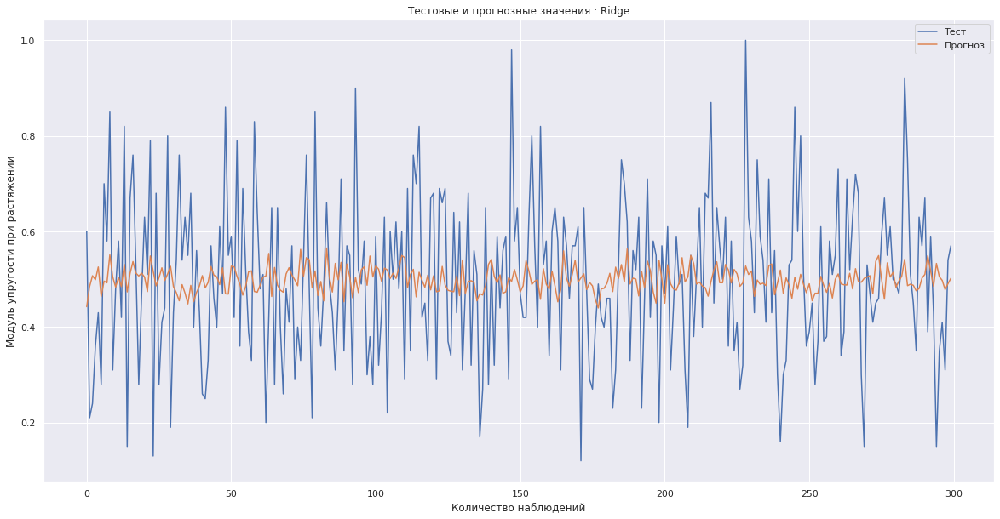

In [ ]:
aapd(y_test_mupr.values, ridge_mupr_predict, 'Модуль упругости при растяжении', 'Ridge')

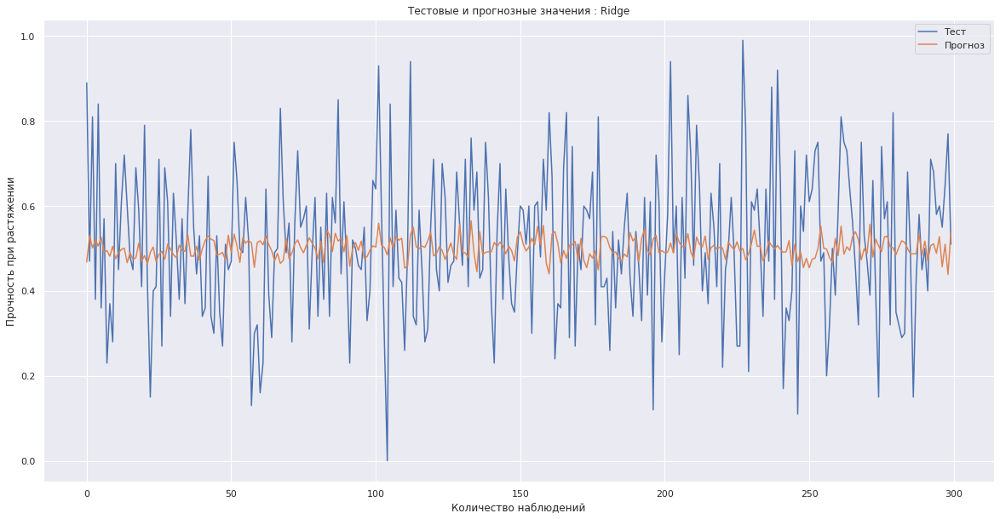

In [ ]:
aapd(y_test_ppr.values, ridge_ppr_predict, 'Прочность при растяжении', 'Ridge')

In [ ]:
ridge_errors = pd.DataFrame({'target_var' : ['Модуль упругости при растяжении', 'Прочность при растяжении'], 'model_name' : 'Ridge', 'MSE' : [ridge_MSE_mupr, ridge_MSE_ppr], 'R2': [ridge_R2_mupr, ridge_R2_ppr]})
errors_df = pd.concat([errors_df, ridge_errors], ignore_index=True)
errors_df

,target_var,model_name,MSE,R2
0,Модуль упругости при растяжении,Linear Regression,0.028721,-3.703719e-03
1,Прочность при растяжении,Linear Regression,0.031086,4.675903e-03
2,Модуль упругости при растяжении,Gradient Boosting,0.028560,1.911773e-03
3,Прочность при растяжении,Gradient Boosting,0.031410,-5.704294e-03
4,Модуль упругости при растяжении,LightGBM,0.028612,1.004121e-04
5,Прочность при растяжении,LightGBM,0.031242,-3.286992e-04
6,Модуль упругости при растяжении,XGBoost,0.028431,6.432811e-03
7,Прочность при растяжении,XGBoost,0.031202,9.667383e-04
8,Модуль упругости при растяжении,RandomForest,0.028702,-3.062134e-03
9,Прочность при растяжении,RandomForest,0.031056,5.653061e-03


##Нейронная сеть библиотека sklearn

In [ ]:
mlpr = MLPRegressor()
mlpr_params = {
    'hidden_layer_sizes' : [(100, 100, 50, 25, 12), (144, 144, 72, 36, 12, 1), (12, 12, 12, 12, 12), (144, 144, 144, 72, 72, 36, 36), ()],
    'activation' : ['identity', 'logistic', 'tanh', 'relu'],
    'solver' : ['sgd', 'adam'],
    'max_iter' : [100],
    'learning_rate' : ['constant', 'adaptive', 'invscaling']
}

In [ ]:
GSCV_mlpr_mupr = GridSearchCV(mlpr, mlpr_params, n_jobs=-1, cv=10)
GSCV_mlpr_mupr.fit(x_train_mupr,y_train_mupr)

GridSearchCV(cv=10, estimator=MLPRegressor(), n_jobs=-1,
             param_grid={'activation': ['identity', 'logistic', 'tanh', 'relu'],
                         'hidden_layer_sizes': [(100, 100, 50, 25, 12),
                                                (144, 144, 72, 36, 12, 1),
                                                (12, 12, 12, 12, 12),
                                                (144, 144, 144, 72, 72, 36, 36),
                                                ()],
                         'learning_rate': ['constant', 'adaptive',
                                           'invscaling'],
                         'max_iter': [100], 'solver': ['sgd', 'adam']})

In [ ]:
mlpr_mupr = GSCV_mlpr_mupr.best_estimator_
mlpr_mupr_predict = mlpr_mupr.predict(x_test_mupr)

In [ ]:
mlpr_MSE_mupr = mean_squared_error(y_test_mupr, mlpr_mupr_predict)
mlpr_R2_mupr = r2_score(y_test_mupr, mlpr_mupr_predict)
mlpr_MSE_mupr, mlpr_R2_mupr

(0.02861498569698502, -4.509207222502809e-06)

In [ ]:
GSCV_mlpr_ppr = GridSearchCV(mlpr, mlpr_params, n_jobs=-1, cv=10)
GSCV_mlpr_ppr.fit(x_train_ppr, y_train_ppr)

GridSearchCV(cv=10, estimator=MLPRegressor(), n_jobs=-1,
             param_grid={'activation': ['identity', 'logistic', 'tanh', 'relu'],
                         'hidden_layer_sizes': [(100, 100, 50, 25, 12),
                                                (144, 144, 72, 36, 12, 1),
                                                (12, 12, 12, 12, 12),
                                                (144, 144, 144, 72, 72, 36, 36),
                                                ()],
                         'learning_rate': ['constant', 'adaptive',
                                           'invscaling'],
                         'max_iter': [100], 'solver': ['sgd', 'adam']})

In [ ]:
mlpr_ppr = GSCV_mlpr_ppr.best_estimator_
mlpr_ppr_predict = mlpr_ppr.predict(x_test_ppr)

In [ ]:
mlpr_MSE_ppr = mean_squared_error(y_test_ppr, mlpr_ppr_predict)
mlpr_R2_ppr = r2_score(y_test_ppr, mlpr_ppr_predict)
mlpr_MSE_ppr, mlpr_R2_ppr

(0.031249474613804652, -0.0005568402301472375)

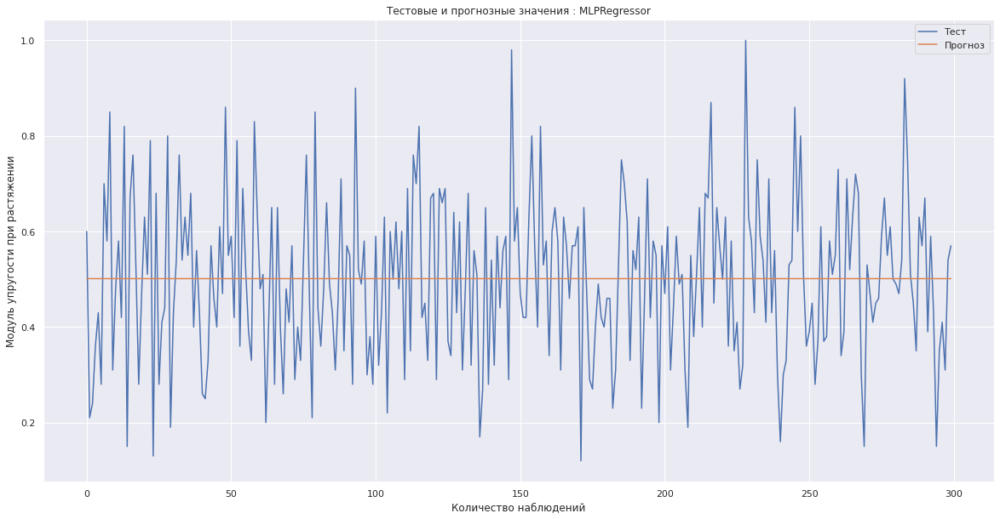

In [ ]:
aapd(y_test_mupr.values, mlpr_mupr_predict, 'Модуль упругости при растяжении', 'MLPRegressor')

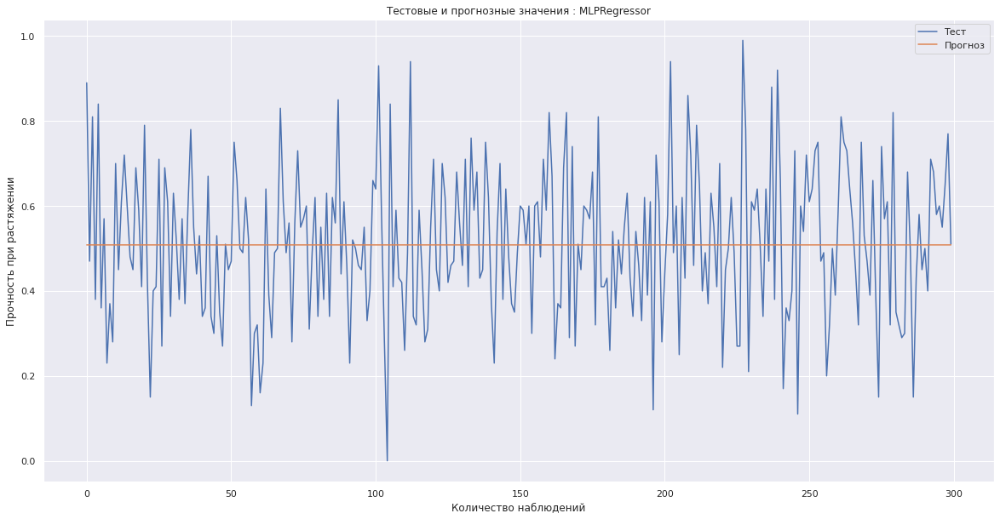

In [ ]:
aapd(y_test_ppr.values, mlpr_ppr_predict, 'Прочность при растяжении', 'MLPRegressor')

In [ ]:
mlpr_errors = pd.DataFrame({'target_var' : ['Модуль упругости при растяжении', 'Прочность при растяжении'], 'model_name' : 'MLPRegressor', 'MSE' : [mlpr_MSE_mupr, mlpr_MSE_ppr], 'R2': [mlpr_R2_mupr, mlpr_R2_ppr]})
errors_df = pd.concat([errors_df, mlpr_errors], ignore_index=True)
errors_df

,target_var,model_name,MSE,R2
0,Модуль упругости при растяжении,Linear Regression,0.028721,-3.703719e-03
1,Прочность при растяжении,Linear Regression,0.031086,4.675903e-03
2,Модуль упругости при растяжении,Gradient Boosting,0.028560,1.911773e-03
3,Прочность при растяжении,Gradient Boosting,0.031410,-5.704294e-03
4,Модуль упругости при растяжении,LightGBM,0.028612,1.004121e-04
5,Прочность при растяжении,LightGBM,0.031242,-3.286992e-04
6,Модуль упругости при растяжении,XGBoost,0.028431,6.432811e-03
7,Прочность при растяжении,XGBoost,0.031202,9.667383e-04
8,Модуль упругости при растяжении,RandomForest,0.028702,-3.062134e-03
9,Прочность при растяжении,RandomForest,0.031056,5.653061e-03


##Нейронная сеть c библиотекой keras

In [ ]:
mupr_nn_model = Sequential()
mupr_nn_model.add(Dense(128, activation = 'relu'))
mupr_nn_model.add(Dense(128, activation = 'relu'))
mupr_nn_model.add(Dense(128, activation = 'relu'))
mupr_nn_model.add(Dense(64, activation = 'relu'))
mupr_nn_model.add(Dense(64, activation = 'relu'))
mupr_nn_model.add(Dense(32, activation = 'relu'))
mupr_nn_model.add(Dense(16, activation = 'relu'))
mupr_nn_model.add(Dense(1, activation = 'sigmoid'))

In [ ]:
mupr_nn_model.compile(loss = 'mean_squared_error', optimizer = Adam(0.001))


In [ ]:
mupr_history = mupr_nn_model.fit(x_train_mupr, y_train_mupr, epochs=200, verbose=1, validation_split = 0.2)

Epoch 1/200
18/18 [==============================] - 3s 15ms/step - loss: 0.0280 - val_loss: 0.0294
Epoch 2/200
18/18 [==============================] - 0s 5ms/step - loss: 0.0277 - val_loss: 0.0297
Epoch 3/200
18/18 [==============================] - 0s 5ms/step - loss: 0.0276 - val_loss: 0.0296
Epoch 4/200
18/18 [==============================] - 0s 5ms/step - loss: 0.0278 - val_loss: 0.0297
Epoch 5/200
18/18 [==============================] - 0s 5ms/step - loss: 0.0276 - val_loss: 0.0301
Epoch 6/200
18/18 [==============================] - 0s 4ms/step - loss: 0.0275 - val_loss: 0.0302
Epoch 7/200
18/18 [==============================] - 0s 5ms/step - loss: 0.0274 - val_loss: 0.0302
Epoch 8/200
18/18 [==============================] - 0s 4ms/step - loss: 0.0273 - val_loss: 0.0310
Epoch 9/200
18/18 [==============================] - 0s 5ms/step - loss: 0.0272 - val_loss: 0.0299
Epoch 10/200
18/18 [==============================] - 0s 5ms/step - loss: 0.0273 - val_loss: 0.0310
Epoch 11

In [ ]:
ppr_nn_model = Sequential()
ppr_nn_model.add(Dense(128, activation = 'relu'))
ppr_nn_model.add(Dense(128, activation = 'relu'))
ppr_nn_model.add(Dense(128, activation = 'relu'))
ppr_nn_model.add(Dense(64, activation = 'relu'))
ppr_nn_model.add(Dense(64, activation = 'relu'))
ppr_nn_model.add(Dense(32, activation = 'relu'))
ppr_nn_model.add(Dense(16, activation = 'relu'))
ppr_nn_model.add(Dense(1, activation = 'sigmoid'))
ppr_nn_model.compile(loss = 'mean_squared_error', optimizer = Adam(0.001))

In [ ]:
ppr_history = ppr_nn_model.fit(x_train_ppr, y_train_ppr, epochs=200, verbose=1, validation_split = 0.2)

Epoch 1/200
18/18 [==============================] - 1s 13ms/step - loss: 0.0295 - val_loss: 0.0272
Epoch 2/200
18/18 [==============================] - 0s 4ms/step - loss: 0.0294 - val_loss: 0.0270
Epoch 3/200
18/18 [==============================] - 0s 5ms/step - loss: 0.0294 - val_loss: 0.0270
Epoch 4/200
18/18 [==============================] - 0s 5ms/step - loss: 0.0294 - val_loss: 0.0270
Epoch 5/200
18/18 [==============================] - 0s 4ms/step - loss: 0.0293 - val_loss: 0.0271
Epoch 6/200
18/18 [==============================] - 0s 5ms/step - loss: 0.0292 - val_loss: 0.0270
Epoch 7/200
18/18 [==============================] - 0s 5ms/step - loss: 0.0293 - val_loss: 0.0269
Epoch 8/200
18/18 [==============================] - 0s 4ms/step - loss: 0.0294 - val_loss: 0.0270
Epoch 9/200
18/18 [==============================] - 0s 5ms/step - loss: 0.0290 - val_loss: 0.0270
Epoch 10/200
18/18 [==============================] - 0s 5ms/step - loss: 0.0288 - val_loss: 0.0268
Epoch 11

In [ ]:
mupr_nn_model_predict = mupr_nn_model.predict(x_test_mupr)

10/10 [==============================] - 0s 2ms/step


In [ ]:
ppr_nn_model_predict = ppr_nn_model.predict(x_test_ppr)

10/10 [==============================] - 0s 2ms/step


In [ ]:
nn_model_MSE_mupr = mean_squared_error(y_test_mupr, mupr_nn_model_predict)
nn_model_R2_mupr = r2_score(y_test_mupr, mupr_nn_model_predict)
nn_model_MSE_mupr, nn_model_R2_mupr

(0.047519684832522696, -0.6606647863408028)

In [ ]:
nn_model_MSE_ppr = mean_squared_error(y_test_ppr, ppr_nn_model_predict)
nn_model_R2_ppr = r2_score(y_test_ppr, ppr_nn_model_predict)
nn_model_MSE_ppr, nn_model_R2_ppr

(0.04913313250087267, -0.5731621863480982)

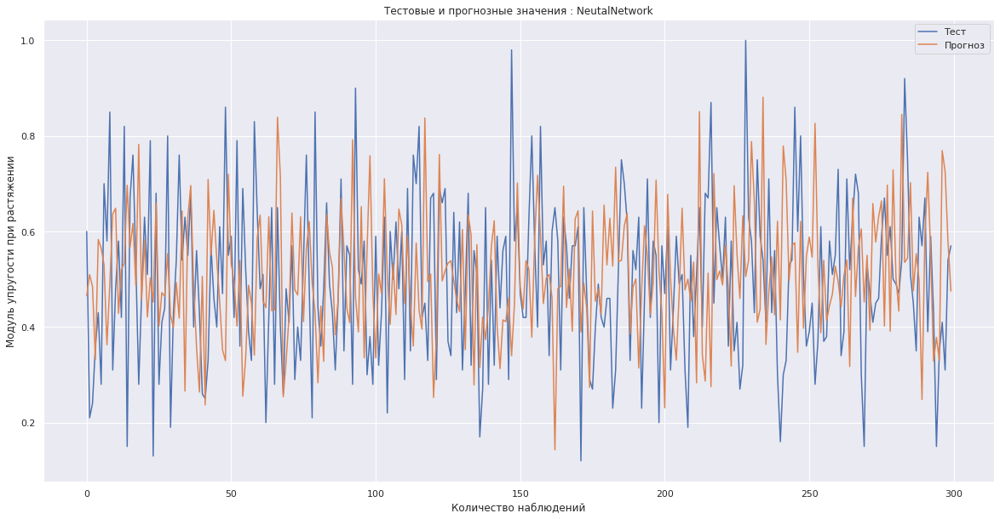

In [ ]:
aapd(y_test_mupr.values, mupr_nn_model_predict, 'Модуль упругости при растяжении', 'NeutalNetwork')

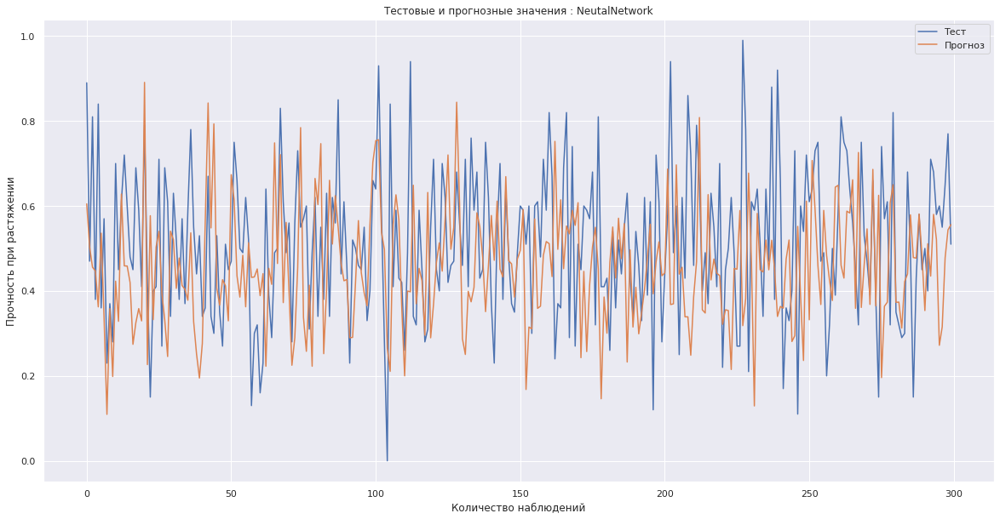

In [ ]:
aapd(y_test_ppr.values, ppr_nn_model_predict, 'Прочность при растяжении', 'NeutalNetwork')

In [ ]:
nn_model_errors = pd.DataFrame({'target_var' : ['Модуль упругости при растяжении', 'Прочность при растяжении'], 'model_name' : 'Neuralnetwork', 'MSE' : [nn_model_MSE_mupr, nn_model_MSE_ppr], 'R2': [nn_model_R2_mupr, nn_model_R2_ppr]})
errors_df = pd.concat([errors_df, nn_model_errors], ignore_index=True)
errors_df

,target_var,model_name,MSE,R2
0,Модуль упругости при растяжении,Linear Regression,0.028721,-3.703719e-03
1,Прочность при растяжении,Linear Regression,0.031086,4.675903e-03
2,Модуль упругости при растяжении,Gradient Boosting,0.028560,1.911773e-03
3,Прочность при растяжении,Gradient Boosting,0.031410,-5.704294e-03
4,Модуль упругости при растяжении,LightGBM,0.028612,1.004121e-04
5,Прочность при растяжении,LightGBM,0.031242,-3.286992e-04
6,Модуль упругости при растяжении,XGBoost,0.028431,6.432811e-03
7,Прочность при растяжении,XGBoost,0.031202,9.667383e-04
8,Модуль упругости при растяжении,RandomForest,0.028702,-3.062134e-03
9,Прочность при растяжении,RandomForest,0.031056,5.653061e-03
